# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:

**Note: if you are using the Udacity workspace, you *DO NOT* need to re-download these - they can be found in the `/data` folder as noted in the cell below.**

* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dog_images`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [6]:
import numpy as np
from glob import glob

# load filenames for human and dog images
human_files = np.array(glob(".\data\lfw\*\*"))
dog_files = np.array(glob(".\data\dogImages\*\*\*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


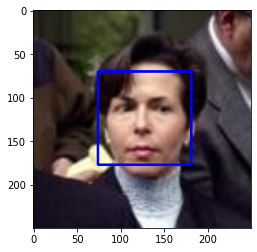

In [7]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('.\haarcascades\haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [14]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline   
import numpy as np
from glob import glob
face_cascade = cv2.CascadeClassifier('.\haarcascades\haarcascade_frontalface_alt.xml')

In [2]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

In [4]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
detected_faces_humans = []
for human_file in human_files_short:
    detected_faces_humans.append(face_detector(human_file))
percentage_detected = sum(detected_faces_humans)/len(detected_faces_humans)*100
print(f"Detected human face in {percentage_detected}% of human images.")

detected_faces_dogs = []
for dogs_file in dog_files_short:
    detected_faces_dogs.append(face_detector(dogs_file))
percentage_detected = sum(detected_faces_dogs)/len(detected_faces_dogs)*100
print(f"Detected human face in {percentage_detected}% of dogs images.")

Detected human face in 97.0% of human images.
Detected human face in 26.0% of dogs images.


We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [3]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()

Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [4]:
from PIL import Image
import torchvision.transforms as transforms

def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''

    input_image = Image.open(img_path)
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0) 

    if torch.cuda.is_available():
        input_batch = input_batch.cuda()

    with torch.no_grad():
        output = VGG16(input_batch)
    # Tensor of shape 1000, with confidence scores (unnormalized) over Imagenet's 1000 classes
    # Run softmax to get probabilities
    #probabilities = torch.nn.functional.softmax(output[0], dim=0)    
    
    return int(torch.argmax(output[0]).item()) # predicted class index

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [5]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    predicted_index = VGG16_predict(img_path)
    dog_indices = range(151,269)  
    return predicted_index in dog_indices

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 


In [9]:
### Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
detected_dogs = []
for dog_file in dog_files_short:
    dog_found = dog_detector(dog_file)
    detected_dogs.append(dog_found)
percentage_detected = sum(detected_dogs)/len(detected_dogs)*100
print(f"Detected dog in {percentage_detected}% of dog images.")

detected_dogs = []
for human_file in human_files_short:
    dog_found = dog_detector(human_file)
    detected_dogs.append(dog_found)
percentage_detected = sum(detected_dogs)/len(detected_dogs)*100
print(f"Detected dog in {percentage_detected}% of human images.")



Detected dog in 87.0% of dog images.
Detected dog in 0.0% of human images.


We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dog_images/train`, `dog_images/valid`, and `dog_images/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

Define and test dog dataset

In [6]:
import matplotlib.pyplot as plt
import os
from torchvision import datasets
from pathlib import Path
import sklearn
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset

class DogDataset(Dataset):
    def __init__(self, img_dir=".\data\dogImages\test", transform=None, target_transform=None, limit_images=None):
        labels = []
        images = []
        class_names = {}
        for folder in os.listdir(img_dir):
            label = int(folder.split(".")[0])-1 # folder names have labels 1-133, but labels have to start at 0 for pytorch
            class_names[label]=folder.split(".")[1] # class_names has for each lable index the corresponding class name
            image_paths = [os.path.join(img_dir, folder, img) for img in os.listdir(os.path.join(img_dir, folder))]
            for img in image_paths:
                images.append(img)
                labels.append(label)
        self.image_dirs, self.img_labels = sklearn.utils.shuffle(images, labels, random_state=0)
        if limit_images:
            self.image_dirs = self.image_dirs[:limit_images]
            self.img_labels = self.img_labels[:limit_images]
        self.transform = transform
        self.target_transform = target_transform
        class_names = sorted(class_names.items())
        self.classes = [class_name[1] for class_name in class_names]

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = self.image_dirs[idx]
        image = Image.open(img_path)
        # image is rgb already since PIL follows RGB color convention
        label = self.img_labels[idx]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label
    
number_of_classes_in_train_set = 133

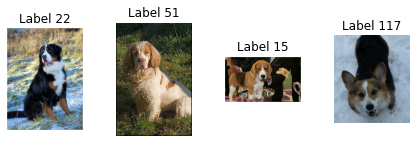

836


In [25]:
dog_dataset_test = DogDataset(".\data\dogImages\test")
fig = plt.figure()
for i in range(len(dog_dataset_test)):
    sample = dog_dataset_test[i]
    ax = plt.subplot(1, 4, i + 1)
    plt.tight_layout()
    ax.set_title('Label {}'.format(sample[1]))
    ax.axis('off')
    plt.imshow(sample[0])
    if i == 3:
        plt.show()
        break
        
print(len(dog_dataset_test))

In [11]:
number_of_classes_in_train_set = 133

Explore shapes of images in the train set

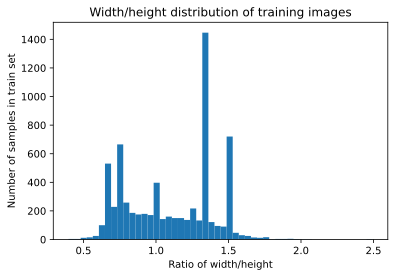

Median of Width/height distribution: 1.1327779314159292
5% quantile of heights: 269.0


In [41]:
dog_dataset_train = DogDataset(".\data\dogImages\train")
widths = []
heights = []
length_ratios = []
for i in range(len(dog_dataset_train)):
    sample_image = dog_dataset_train[i][0]
    width, height = sample_image.size
    widths.append(width)
    heights.append(height)
    length_ratios.append(width/height)
plt.hist(length_ratios, bins=50)
plt.title("Width/height distribution of training images")
plt.xlabel("Ratio of width/height")
plt.show()
print(f"Median of Width/height distribution: {pd.DataFrame(length_ratios).median()[0]}")
print(f"5% quantile of heights: {pd.DataFrame(heights).quantile(0.05)[0]}")


Explore class distribution in train set

Text(0, 0.5, 'Number of samples in train set')

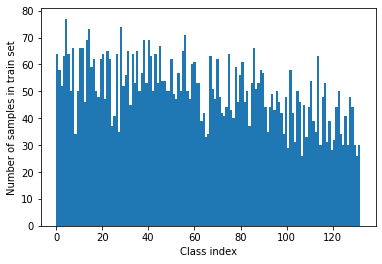

In [28]:
from collections import Counter
import matplotlib.pyplot as plt
train_classes = [label for _, label in dog_dataset_train]
plt.hist(train_classes, bins=133)
plt.xlabel("Class index")
plt.ylabel("Number of samples in train set")

Text(0, 0.5, 'Number of samples in test set')

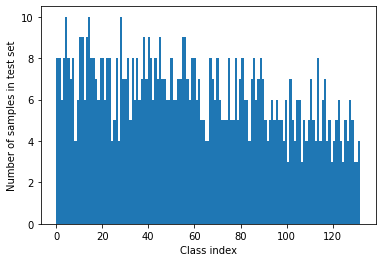

In [29]:
from collections import Counter
import matplotlib.pyplot as plt
test_classes = [label for _, label in dog_dataset_test]
plt.hist(test_classes, bins=133)
plt.xlabel("Class index")
plt.ylabel("Number of samples in test set")

Define dataloaders for training, validation, and test sets

In [7]:


from torch.utils.data import DataLoader
from PIL import Image
import torchvision.transforms as transforms



train_transforms = transforms.Compose([transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(20),                                         
                                       transforms.Resize(304),
                                       transforms.RandomCrop((269, 304)),
                                       transforms.ToTensor()])
                                      
test_valid_transforms = transforms.Compose([transforms.Resize(304),
                                            transforms.CenterCrop((269, 304)),
                                            transforms.ToTensor()])

batch_size = 16
train_dataloader = DataLoader(DogDataset(".\\data\\dogImages\\train", transform=train_transforms), batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(DogDataset(".\\data\\dogImages\\valid", transform=test_valid_transforms), batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(DogDataset(".\\data\\dogImages\\test", transform=test_valid_transforms), batch_size=batch_size, shuffle=False)
                               

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:
For the training images the median of width/height distribution is approx. 1.13. Therefore I chose to resize all images in a way that their width/height ratio matches this. Since it is a lot better to use downscale images for a CNN classifier than upscaled ones I decided to take as a common height the 5% quantile of heights of the training images (e.g. 95% of the training images have at least this height). This leaves us with a final image size of height=269 and width=1.13*269=303.97~304. To get all images to the approximately desired size (while maintaining their aspect ratios) I resized them in a way that their smaller edge is 304 (resulting in images that all have at least height 269 and width 304 but are not unnecessarily large). In order to get all images to the desired aspect ratio: Since stretching the images to the desired aspect ratio could destroy the visual appearance of the objects I used cropping. Since during training some augmentation is a good idea anyway I used RandomCrop for the train set. For the test set I used the normal CenterCrop. For the train set I additionally applied augmentation via random horizontal flips and rotation up to 20 degrees. This helps improving generalization abilities of the trained model and avoids overfitting (since the training dataset is with 6680 samples not very large for this difficult task of distinguishing 133 classes). For choosing the batch size, I took into account that when you choose it too small you won't fully use the computational speedups from the parallelism of GPUs and moreover when choosing a bigger batch size you will more likely end up in a globally optimal solution. However, a reallly large batch_size can slow down the training process empirically, meaning that with a small batch size you will faster end up in a quite "good" solution than when searching with a big batch size for an more optimal solution. Samller batch sizes also have the advantage of better generalization of the model. Therefore I decided to use a "middle large" batch size of 16. 

0 torch.Size([16, 3, 269, 304]) torch.Size([16])
1 torch.Size([16, 3, 269, 304]) torch.Size([16])
2 torch.Size([16, 3, 269, 304]) torch.Size([16])
3 torch.Size([16, 3, 269, 304]) torch.Size([16])


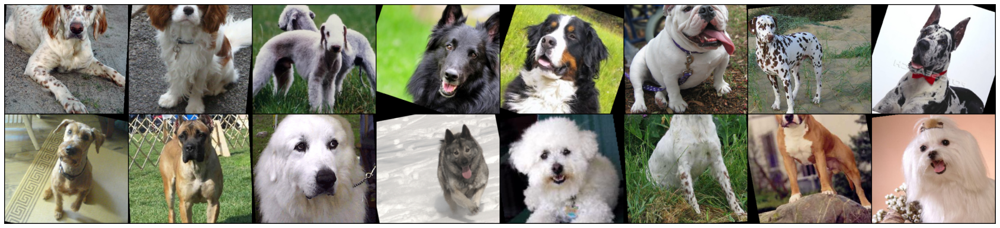

0 torch.Size([16, 3, 269, 304]) torch.Size([16])
1 torch.Size([16, 3, 269, 304]) torch.Size([16])
2 torch.Size([16, 3, 269, 304]) torch.Size([16])
3 torch.Size([16, 3, 269, 304]) torch.Size([16])


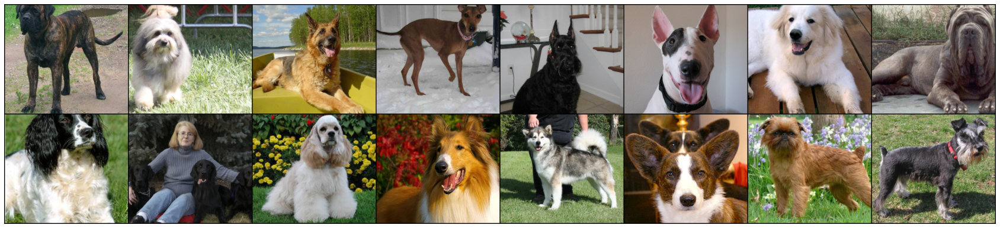

In [15]:
from torchvision import transforms, utils
def show_dogs_batch(sample_batched):
    """Show image with landmarks for a batch of samples."""
    images_batch, labels_batch = \
            sample_batched[0], sample_batched[1]
    batch_size = len(images_batch)
    im_size = images_batch.size(2)
    grid_border_size = 2

    grid = utils.make_grid(images_batch)
    plt.imshow(grid.numpy().transpose((1, 2, 0)))

    

for i_batch, sample_batched in enumerate(train_dataloader):
    print(i_batch, sample_batched[0].size(),
          sample_batched[1].size())

    # observe 4th batch and stop.
    if i_batch == 3:
        plt.figure(figsize=(30,30))
        show_dogs_batch(sample_batched)
        plt.axis('off')
        plt.ioff()
        plt.show()
        break
        
for i_batch, sample_batched in enumerate(test_dataloader):
    print(i_batch, sample_batched[0].size(),
          sample_batched[1].size())

    # observe 4th batch and stop.
    if i_batch == 3:
        plt.figure(figsize=(30,30))
        show_dogs_batch(sample_batched)
        plt.axis('off')
        plt.ioff()
        plt.show()
        break

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [16]:
import torch.nn as nn
import torch.nn.functional as F
import torch


# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=0)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, stride=1, padding=0)
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)
        self.dropout1 = nn.Dropout(0.1)
        
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=0)
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=0)
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)
        self.dropout2 = nn.Dropout(0.1)
        
        self.conv5 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=0)
        self.conv6 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=0)
        self.maxpool3 = nn.MaxPool2d(kernel_size=2)
        self.dropout3 = nn.Dropout(0.1)
        # x has now shape [batch_size, 128, 30, 34]
        flatten_input_dim = 128* 30* 34
        
        self.fc1 = nn.Linear(flatten_input_dim, 128)
        self.fc2 = nn.Linear(128, number_of_classes_in_train_set)
        self.dropout4 = nn.Dropout(0.3)
    
    def forward(self, x):
        ## Define forward behavior
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = self.maxpool1(x)
        x = self.dropout1(x)
        
        x = self.conv3(x)
        x = F.relu(x)
        x = self.conv4(x)
        x = F.relu(x)
        x = self.maxpool2(x)
        x = self.dropout2(x)
        
        x = self.conv5(x)
        x = F.relu(x)
        x = self.conv6(x)
        x = F.relu(x)
        x = self.maxpool3(x)
        x = self.dropout3(x)
        
        x = x.view(x.size()[0], -1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout4(x)
        x = self.fc2(x)
        output = F.log_softmax(x, dim=1)
        
        return output

#-#-# You so NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

device = "cuda:4"



In [18]:
# move tensors to GPU if CUDA is available
use_cuda = torch.cuda.is_available()
#use_cuda = False
if use_cuda:
    model_scratch.to(device)

In [19]:
# test correct model output dimensions
for batch in test_dataloader:
    my_batch = batch[0].to(device)
    output = model_scratch(my_batch)
    print(output.size())
    break


torch.Size([16, 133])


__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ When designing the model architecture I had in mind that the net mustn't be too deep/wide (have too many parameters), otherwise training will take a lot of time. but it must be complex enough s.th. it can capture enough image details to be able to perform the difficult classification task of classifying dog breeds. I decided to use 3 convolutional blocks, each constiting of 2 relu-activated 3x3 convoultions followed by a 2x2 maxpooling and dropout layer. During these 3 convolution-maxpooling blocks the height and width of intermediate output tensors decreases while its number of channels increases. This follows the well known idea in literature that deeper layers contain "more aggregated" information while early layers capture the basis features in finer grained details. I decided to use relu activation functions since this has a reduced likelihood of the gradient to vanish. Dropout is good to add to aviod overfitting. After the 3 conv-pooling blocks there are 2 linear layers and one dropout layer as "classification head" followed by a log-softmax function that returns log-probabilites as output of the net. After training this architecture for 100 epochs I got reasonably good (for training from scratch a really small net) classification results (22% accuracy on the test set), that's why I didn't have to re-visit my architectural decisions. 

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [20]:
import torch.optim as optim

criterion_scratch = nn.NLLLoss()

#optimizer_scratch = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
optimizer_scratch = optim.Adam(model_scratch.parameters(), lr=0.0001)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [21]:
loaders_scratch = {}
#loaders_scratch['train'] = train_dataloader_small
#loaders_scratch['valid'] = valid_dataloader_small
loaders_scratch['train'] = train_dataloader
loaders_scratch['valid'] = valid_dataloader

In [22]:
! pip install tensorboard

In [10]:
from PIL import ImageFile
from torch.utils.tensorboard import SummaryWriter
ImageFile.LOAD_TRUNCATED_IMAGES = True
import numpy as np
from tqdm import tqdm
def train(n_epochs, loaders, model, optimizer, criterion, device, save_path, lr_scheduler=None):
    """returns trained model"""
    writer = SummaryWriter('.\runs\transfer_learning')
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    count_lr_reduction = 0
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(tqdm(loaders['train'])):
            # move to GPU
            if device:
                data, target = data.to(device), target.to(device)
            ## find the loss and update the model parameters accordingly
            optimizer.zero_grad()
            outputs = model(data)
            #print(outputs.size())
            #print(target.size())
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            ## record the average training loss
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(tqdm(loaders['valid'])):
            # move to GPU
            if device:
                data, target = data.to(device), target.to(device)
            ## update the average validation loss
            outputs = model(data)
            loss = criterion(outputs, target)
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
            
        if lr_scheduler:
            lr_scheduler.step(valid_loss)    
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        writer.add_scalar('training loss',
                            train_loss,
                            epoch)
        writer.add_scalar('validation loss',
                            valid_loss,
                            epoch)
        
        ## save the model if validation loss has decreased
        if valid_loss<valid_loss_min:
            valid_loss_min = valid_loss
            torch.save(model.state_dict(), save_path)
            print(f"Saving model at epoch {epoch}")
            
    # return trained model
    return model


In [24]:
# train the model
model_scratch = train(100, loaders_scratch, model_scratch, optimizer_scratch, 
                      criterion_scratch, device, 'model_scratch.pt')

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

100%|██████████| 53/53 [00:08<00:00,  6.07it/s]


Epoch: 1 	Training Loss: 4.888025 	Validation Loss: 4.878128
Saving model at epoch 1


100%|██████████| 53/53 [00:08<00:00,  6.25it/s]


Epoch: 2 	Training Loss: 4.851630 	Validation Loss: 4.812473
Saving model at epoch 2


100%|██████████| 53/53 [00:08<00:00,  6.43it/s]


Epoch: 3 	Training Loss: 4.784225 	Validation Loss: 4.723274
Saving model at epoch 3


100%|██████████| 53/53 [00:08<00:00,  6.34it/s]


Epoch: 4 	Training Loss: 4.727490 	Validation Loss: 4.652006
Saving model at epoch 4


100%|██████████| 53/53 [00:08<00:00,  6.10it/s]


Epoch: 5 	Training Loss: 4.670544 	Validation Loss: 4.591625
Saving model at epoch 5


100%|██████████| 53/53 [00:08<00:00,  5.95it/s]


Epoch: 6 	Training Loss: 4.629232 	Validation Loss: 4.544322
Saving model at epoch 6


100%|██████████| 53/53 [00:09<00:00,  5.85it/s]


Epoch: 7 	Training Loss: 4.564792 	Validation Loss: 4.463395
Saving model at epoch 7


100%|██████████| 53/53 [00:08<00:00,  5.97it/s]


Epoch: 8 	Training Loss: 4.526638 	Validation Loss: 4.408475
Saving model at epoch 8


100%|██████████| 53/53 [00:09<00:00,  5.72it/s]


Epoch: 9 	Training Loss: 4.464042 	Validation Loss: 4.399598
Saving model at epoch 9


100%|██████████| 53/53 [00:09<00:00,  5.83it/s]


Epoch: 10 	Training Loss: 4.410101 	Validation Loss: 4.320903
Saving model at epoch 10


100%|██████████| 53/53 [00:08<00:00,  6.23it/s]


Epoch: 11 	Training Loss: 4.370798 	Validation Loss: 4.245120
Saving model at epoch 11


100%|██████████| 53/53 [00:09<00:00,  5.79it/s]


Epoch: 12 	Training Loss: 4.316494 	Validation Loss: 4.217856
Saving model at epoch 12


100%|██████████| 53/53 [00:08<00:00,  6.02it/s]


Epoch: 13 	Training Loss: 4.300121 	Validation Loss: 4.223882


100%|██████████| 53/53 [00:09<00:00,  5.87it/s]


Epoch: 14 	Training Loss: 4.269323 	Validation Loss: 4.152234
Saving model at epoch 14


100%|██████████| 53/53 [00:13<00:00,  3.99it/s]


Epoch: 15 	Training Loss: 4.231255 	Validation Loss: 4.105530
Saving model at epoch 15


100%|██████████| 53/53 [00:08<00:00,  6.04it/s]


Epoch: 16 	Training Loss: 4.205106 	Validation Loss: 4.132194


100%|██████████| 53/53 [00:09<00:00,  5.88it/s]


Epoch: 17 	Training Loss: 4.175598 	Validation Loss: 4.041994
Saving model at epoch 17


100%|██████████| 53/53 [00:08<00:00,  6.20it/s]


Epoch: 18 	Training Loss: 4.134372 	Validation Loss: 4.034875
Saving model at epoch 18


100%|██████████| 53/53 [00:08<00:00,  6.05it/s]


Epoch: 19 	Training Loss: 4.123768 	Validation Loss: 4.011451
Saving model at epoch 19


100%|██████████| 53/53 [00:08<00:00,  6.24it/s]


Epoch: 20 	Training Loss: 4.096955 	Validation Loss: 3.992536
Saving model at epoch 20


100%|██████████| 53/53 [00:08<00:00,  6.29it/s]


Epoch: 21 	Training Loss: 4.071987 	Validation Loss: 3.949980
Saving model at epoch 21


100%|██████████| 53/53 [00:09<00:00,  5.66it/s]


Epoch: 22 	Training Loss: 4.033666 	Validation Loss: 3.950849


100%|██████████| 53/53 [00:08<00:00,  6.07it/s]


Epoch: 23 	Training Loss: 4.014704 	Validation Loss: 3.931551
Saving model at epoch 23


100%|██████████| 53/53 [00:08<00:00,  6.12it/s]


Epoch: 24 	Training Loss: 4.001623 	Validation Loss: 3.928547
Saving model at epoch 24


100%|██████████| 53/53 [00:09<00:00,  5.81it/s]


Epoch: 25 	Training Loss: 3.960052 	Validation Loss: 3.886677
Saving model at epoch 25


100%|██████████| 53/53 [00:10<00:00,  5.01it/s]


Epoch: 26 	Training Loss: 3.947494 	Validation Loss: 3.870586
Saving model at epoch 26


100%|██████████| 53/53 [00:08<00:00,  6.14it/s]


Epoch: 27 	Training Loss: 3.916704 	Validation Loss: 3.839012
Saving model at epoch 27


100%|██████████| 53/53 [00:08<00:00,  5.93it/s]


Epoch: 28 	Training Loss: 3.890644 	Validation Loss: 3.854703


100%|██████████| 53/53 [00:08<00:00,  6.21it/s]


Epoch: 29 	Training Loss: 3.875759 	Validation Loss: 3.811036
Saving model at epoch 29


100%|██████████| 53/53 [00:10<00:00,  5.20it/s]


Epoch: 30 	Training Loss: 3.860901 	Validation Loss: 3.831993


100%|██████████| 53/53 [00:09<00:00,  5.72it/s]


Epoch: 31 	Training Loss: 3.845353 	Validation Loss: 3.752410
Saving model at epoch 31


100%|██████████| 53/53 [00:08<00:00,  5.94it/s]


Epoch: 32 	Training Loss: 3.828048 	Validation Loss: 3.769629


100%|██████████| 53/53 [00:09<00:00,  5.41it/s]


Epoch: 33 	Training Loss: 3.774952 	Validation Loss: 3.825753


100%|██████████| 53/53 [00:10<00:00,  4.96it/s]


Epoch: 34 	Training Loss: 3.767125 	Validation Loss: 3.758973


100%|██████████| 53/53 [00:09<00:00,  5.61it/s]


Epoch: 35 	Training Loss: 3.751490 	Validation Loss: 3.746371
Saving model at epoch 35


100%|██████████| 53/53 [00:09<00:00,  5.34it/s]


Epoch: 36 	Training Loss: 3.729451 	Validation Loss: 3.674260
Saving model at epoch 36


100%|██████████| 53/53 [00:09<00:00,  5.85it/s]


Epoch: 37 	Training Loss: 3.708360 	Validation Loss: 3.693315


100%|██████████| 53/53 [00:10<00:00,  5.30it/s]


Epoch: 38 	Training Loss: 3.693482 	Validation Loss: 3.678323


100%|██████████| 53/53 [00:10<00:00,  5.03it/s]


Epoch: 39 	Training Loss: 3.686427 	Validation Loss: 3.653575
Saving model at epoch 39


100%|██████████| 53/53 [00:09<00:00,  5.88it/s]


Epoch: 40 	Training Loss: 3.649112 	Validation Loss: 3.649432
Saving model at epoch 40


100%|██████████| 53/53 [00:08<00:00,  6.32it/s]


Epoch: 41 	Training Loss: 3.635511 	Validation Loss: 3.632681
Saving model at epoch 41


100%|██████████| 53/53 [00:08<00:00,  6.13it/s]


Epoch: 42 	Training Loss: 3.621028 	Validation Loss: 3.628560
Saving model at epoch 42


100%|██████████| 53/53 [00:10<00:00,  5.20it/s]


Epoch: 43 	Training Loss: 3.598688 	Validation Loss: 3.593113
Saving model at epoch 43


100%|██████████| 53/53 [00:09<00:00,  5.89it/s]


Epoch: 44 	Training Loss: 3.556650 	Validation Loss: 3.585636
Saving model at epoch 44


100%|██████████| 53/53 [00:08<00:00,  6.09it/s]


Epoch: 45 	Training Loss: 3.532610 	Validation Loss: 3.556296
Saving model at epoch 45


100%|██████████| 53/53 [00:09<00:00,  5.47it/s]


Epoch: 46 	Training Loss: 3.541201 	Validation Loss: 3.633812


100%|██████████| 53/53 [00:09<00:00,  5.80it/s]


Epoch: 47 	Training Loss: 3.540297 	Validation Loss: 3.570243


100%|██████████| 53/53 [00:09<00:00,  5.67it/s]


Epoch: 48 	Training Loss: 3.507698 	Validation Loss: 3.555645
Saving model at epoch 48


100%|██████████| 53/53 [00:08<00:00,  5.91it/s]


Epoch: 49 	Training Loss: 3.473450 	Validation Loss: 3.533729
Saving model at epoch 49


100%|██████████| 53/53 [00:08<00:00,  6.16it/s]


Epoch: 50 	Training Loss: 3.468998 	Validation Loss: 3.549077


100%|██████████| 53/53 [00:08<00:00,  5.93it/s]


Epoch: 51 	Training Loss: 3.445807 	Validation Loss: 3.510439
Saving model at epoch 51


100%|██████████| 53/53 [00:08<00:00,  6.21it/s]


Epoch: 52 	Training Loss: 3.455816 	Validation Loss: 3.497725
Saving model at epoch 52


100%|██████████| 53/53 [00:08<00:00,  6.00it/s]


Epoch: 53 	Training Loss: 3.402434 	Validation Loss: 3.508707


100%|██████████| 53/53 [00:08<00:00,  6.12it/s]


Epoch: 54 	Training Loss: 3.425243 	Validation Loss: 3.486881
Saving model at epoch 54


100%|██████████| 53/53 [00:09<00:00,  5.66it/s]


Epoch: 55 	Training Loss: 3.399732 	Validation Loss: 3.466534
Saving model at epoch 55


100%|██████████| 53/53 [00:09<00:00,  5.85it/s]


Epoch: 56 	Training Loss: 3.362779 	Validation Loss: 3.455883
Saving model at epoch 56


100%|██████████| 53/53 [00:09<00:00,  5.52it/s]


Epoch: 57 	Training Loss: 3.368098 	Validation Loss: 3.481704


100%|██████████| 53/53 [00:08<00:00,  6.01it/s]


Epoch: 58 	Training Loss: 3.323397 	Validation Loss: 3.448661
Saving model at epoch 58


100%|██████████| 53/53 [00:09<00:00,  5.60it/s]


Epoch: 59 	Training Loss: 3.320300 	Validation Loss: 3.438423
Saving model at epoch 59


100%|██████████| 53/53 [00:09<00:00,  5.33it/s]


Epoch: 60 	Training Loss: 3.311031 	Validation Loss: 3.416229
Saving model at epoch 60


100%|██████████| 53/53 [00:08<00:00,  6.26it/s]


Epoch: 61 	Training Loss: 3.286337 	Validation Loss: 3.449893


100%|██████████| 53/53 [00:10<00:00,  5.28it/s]


Epoch: 62 	Training Loss: 3.277814 	Validation Loss: 3.455165


100%|██████████| 53/53 [00:09<00:00,  5.62it/s]


Epoch: 63 	Training Loss: 3.261998 	Validation Loss: 3.384790
Saving model at epoch 63


100%|██████████| 53/53 [00:09<00:00,  5.45it/s]


Epoch: 64 	Training Loss: 3.270569 	Validation Loss: 3.369293
Saving model at epoch 64


100%|██████████| 53/53 [00:09<00:00,  5.31it/s]


Epoch: 65 	Training Loss: 3.257577 	Validation Loss: 3.376984


100%|██████████| 53/53 [00:09<00:00,  5.47it/s]


Epoch: 66 	Training Loss: 3.222112 	Validation Loss: 3.347869
Saving model at epoch 66


100%|██████████| 53/53 [00:10<00:00,  5.28it/s]


Epoch: 67 	Training Loss: 3.226596 	Validation Loss: 3.331821
Saving model at epoch 67


100%|██████████| 53/53 [00:09<00:00,  5.59it/s]


Epoch: 68 	Training Loss: 3.200831 	Validation Loss: 3.365709


100%|██████████| 53/53 [00:11<00:00,  4.60it/s]


Epoch: 69 	Training Loss: 3.200193 	Validation Loss: 3.387635


100%|██████████| 53/53 [00:10<00:00,  5.17it/s]


Epoch: 70 	Training Loss: 3.171729 	Validation Loss: 3.345549


100%|██████████| 53/53 [00:11<00:00,  4.64it/s]


Epoch: 71 	Training Loss: 3.177276 	Validation Loss: 3.320912
Saving model at epoch 71


100%|██████████| 53/53 [00:10<00:00,  5.18it/s]


Epoch: 72 	Training Loss: 3.156222 	Validation Loss: 3.326080


100%|██████████| 53/53 [00:10<00:00,  5.29it/s]


Epoch: 73 	Training Loss: 3.146359 	Validation Loss: 3.333059


100%|██████████| 53/53 [00:10<00:00,  4.82it/s]


Epoch: 74 	Training Loss: 3.143738 	Validation Loss: 3.316625
Saving model at epoch 74


100%|██████████| 53/53 [00:09<00:00,  5.37it/s]


Epoch: 75 	Training Loss: 3.095470 	Validation Loss: 3.300224
Saving model at epoch 75


100%|██████████| 53/53 [00:10<00:00,  5.17it/s]


Epoch: 76 	Training Loss: 3.108765 	Validation Loss: 3.295967
Saving model at epoch 76


100%|██████████| 53/53 [00:09<00:00,  5.58it/s]


Epoch: 77 	Training Loss: 3.066834 	Validation Loss: 3.298371


100%|██████████| 53/53 [00:09<00:00,  5.87it/s]


Epoch: 78 	Training Loss: 3.079290 	Validation Loss: 3.297828


100%|██████████| 53/53 [00:09<00:00,  5.30it/s]


Epoch: 79 	Training Loss: 3.072373 	Validation Loss: 3.278930
Saving model at epoch 79


100%|██████████| 53/53 [00:10<00:00,  5.28it/s]


Epoch: 80 	Training Loss: 3.045803 	Validation Loss: 3.326081


100%|██████████| 53/53 [00:11<00:00,  4.79it/s]


Epoch: 81 	Training Loss: 3.054491 	Validation Loss: 3.311130


100%|██████████| 53/53 [00:10<00:00,  5.07it/s]


Epoch: 82 	Training Loss: 3.019984 	Validation Loss: 3.282130


100%|██████████| 53/53 [00:10<00:00,  5.28it/s]


Epoch: 83 	Training Loss: 3.014650 	Validation Loss: 3.302654


100%|██████████| 53/53 [00:09<00:00,  5.36it/s]


Epoch: 84 	Training Loss: 3.000819 	Validation Loss: 3.261769
Saving model at epoch 84


100%|██████████| 53/53 [00:10<00:00,  5.29it/s]


Epoch: 85 	Training Loss: 3.016952 	Validation Loss: 3.244238
Saving model at epoch 85


100%|██████████| 53/53 [00:09<00:00,  5.32it/s]


Epoch: 86 	Training Loss: 2.966029 	Validation Loss: 3.241471
Saving model at epoch 86


100%|██████████| 53/53 [00:10<00:00,  4.98it/s]


Epoch: 87 	Training Loss: 2.973044 	Validation Loss: 3.299442


100%|██████████| 53/53 [00:10<00:00,  5.08it/s]


Epoch: 88 	Training Loss: 2.972205 	Validation Loss: 3.265362


100%|██████████| 53/53 [00:10<00:00,  4.87it/s]


Epoch: 89 	Training Loss: 2.958107 	Validation Loss: 3.186729
Saving model at epoch 89


100%|██████████| 53/53 [00:10<00:00,  5.25it/s]


Epoch: 90 	Training Loss: 2.932614 	Validation Loss: 3.220186


100%|██████████| 53/53 [00:11<00:00,  4.80it/s]


Epoch: 91 	Training Loss: 2.933266 	Validation Loss: 3.204915


100%|██████████| 53/53 [00:15<00:00,  3.42it/s]


Epoch: 92 	Training Loss: 2.920349 	Validation Loss: 3.266028


100%|██████████| 53/53 [00:15<00:00,  3.42it/s]


Epoch: 93 	Training Loss: 2.897069 	Validation Loss: 3.218982


100%|██████████| 53/53 [00:10<00:00,  5.17it/s]


Epoch: 94 	Training Loss: 2.888731 	Validation Loss: 3.193026


100%|██████████| 53/53 [00:10<00:00,  4.84it/s]


Epoch: 95 	Training Loss: 2.890690 	Validation Loss: 3.267330


100%|██████████| 53/53 [00:13<00:00,  3.80it/s]


Epoch: 96 	Training Loss: 2.874481 	Validation Loss: 3.157524
Saving model at epoch 96


100%|██████████| 53/53 [00:11<00:00,  4.74it/s]


Epoch: 97 	Training Loss: 2.887113 	Validation Loss: 3.212415


100%|██████████| 53/53 [00:16<00:00,  3.23it/s]


Epoch: 98 	Training Loss: 2.857056 	Validation Loss: 3.220042


100%|██████████| 53/53 [00:11<00:00,  4.79it/s]


Epoch: 99 	Training Loss: 2.841105 	Validation Loss: 3.180260


100%|██████████| 53/53 [00:12<00:00,  4.16it/s]


Epoch: 100 	Training Loss: 2.843097 	Validation Loss: 3.193484


<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [25]:
loaders_scratch['test'] = test_dataloader

In [4]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.to(device), target.to(device)
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))



In [27]:
# call test function    
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 3.281900


Test Accuracy: 22% (191/836)


---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

I used pytorch lightning (and its CLI) for performing transfer learning. Inspired by an example in the pytorch lightning examples folder (https://github.com/PyTorchLightning/pytorch-lightning/blob/master/pl_examples/domain_templates/computer_vision_fine_tuning.py) I made the files "lightning_module_and_datasets.py" that contains definition of data loaders, model architecture, optimizers and training functionality. For running the training I used the script "lightning_cli_scipt.py". Please have a look at these files.

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

Please see file "lightning_module_and_datasets.py".


__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

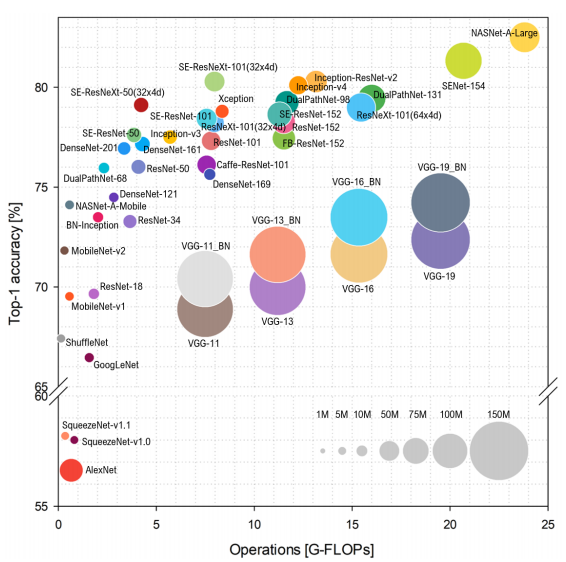
Image source: https://towardsdatascience.com/how-to-choose-the-best-keras-pre-trained-model-for-image-classification-b850ca4428d4

__Answer:__ 
When deciding for a pre-trained architecture to use you have to take two criteria into account: The top1/top5 accuracies obtained on ImageNet, and the training/inference speed (that heavily depends on the number of weights the model contains). When you look at the picture above you want to choose a model in the upper left corner with a top1-accuracy as good as possible but small number of operations. In this regard ResNeXt-101 yields a pretty good tradeoff. ResNeXt has a smart architecture that combines good ideas from several architectures used before: having a shortcut from the previous layer to the next to enable better gradient flow (from ResNet), repeating layers to build a deep model with a lot of learning capacity (from VGG) and usage of a split-transform-merge practise (split the input to multiple blocks and merging them later, from InceptionNet). Compared to InceptionNet, ResNext uses the same topology for parallel blocks that's why fewer parameters for defining the architecture are required while more layers can be added. Fortunately, ResNeXt is availabe as ImageNet-pre-trained model in pytorch. The images we want to classify into dog breeds look quite similar to the ImageNet images, meaning both sets contain photos of real objects. Moreover in the ImageNet pre-training the model learnt already to distiguish 118 different dog types. Of course, the model was focussing not only on dogs back then and we also have different dog breed categories now, but the pre-training task still contained a bit of the task we have to solve now. Therefore we can expect that the features contained in the pre-trained model can be re-used very well even up to deeper layers. Therefore I decided to re-use the full pre-trained net and only replaced the very last linear layer by a few new linear layers where the final one matches the number of dog categories. I finetuned first only these new layers (keeping the well initialized pre-trained features in earlier layers fixed), later I allowed updating also the earlier layers a bit with a lower learning rate. 
For comparison of several model architectures (and out of curiosity how well a smaller model would perform) I also finetuned a ResNet50 and a Mobilenet.

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

Please see file "lightning_module_and_datasets.py".

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

Finetune Mobilenet

In [ ]:
!python ./src/lightning_cli_script.py fit --model.backbone mobilenet_v2 --model.fc_input_size 115200 --trainer.default_root_dir ./pl_checkpoints_final/transfer_mobilenet --trainer.max_epochs 180

Global seed set to 42
Global seed set to 1234
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/raid/user-data/fzimmermann/miniconda3/envs/dog_project/lib/python3.6/site-packages/pytorch_lightning/core/datamodule.py:122: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  "DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7."
/raid/user-data/fzimmermann/miniconda3/envs/dog_project/lib/python3.6/site-packages/pytorch_lightning/core/datamodule.py:115: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  "DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7."
Missing logger folder: pl_checkpoints_final/transfer_mobilenet/lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [7]
The model will start training with only 6 t

Epoch 9: 100%|▉| 468/470 [00:31<00:00, 14.79it/s, loss=1.31, v_num=0, train_loss
Epoch 9: 100%|█| 470/470 [00:31<00:00, 14.74it/s, loss=1.31, v_num=0, train_loss
Epoch 10:  89%|▉| 417/470 [00:28<00:03, 14.49it/s, loss=1.06, v_num=0, train_los
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 10:  89%|▉| 420/470 [00:29<00:03, 14.34it/s, loss=1.06, v_num=0, train_los
Epoch 10:  90%|▉| 424/470 [00:29<00:03, 14.41it/s, loss=1.06, v_num=0, train_los
Epoch 10:  91%|▉| 428/470 [00:29<00:02, 14.45it/s, loss=1.06, v_num=0, train_los
Epoch 10:  92%|▉| 432/470 [00:29<00:02, 14.46it/s, loss=1.06, v_num=0, train_los
Epoch 10:  93%|▉| 436/470 [00:30<00:02, 14.53it/s, loss=1.06, v_num=0, train_los
Validating:  36%|███████████                    | 19/53 [00:01<00:01, 20.45it/s]
Epoch 10:  94%|▉| 440/470 [00:30<00:02, 14.50it/s, loss=1.06, v_num=0, train_los
Epoch 10:  94%|▉| 444/470 [00:30<00:01, 14.57it/s, loss=1.06, v_num=0, train_l

Epoch 20:  94%|▉| 440/470 [00:30<00:02, 14.43it/s, loss=0.862, v_num=0, train_lo
Epoch 20:  94%|▉| 444/470 [00:30<00:01, 14.50it/s, loss=0.862, v_num=0, train_lo
Epoch 20:  95%|▉| 448/470 [00:30<00:01, 14.57it/s, loss=0.862, v_num=0, train_lo
Epoch 20:  96%|▉| 452/470 [00:30<00:01, 14.62it/s, loss=0.862, v_num=0, train_lo
Epoch 20:  97%|▉| 456/470 [00:31<00:00, 14.63it/s, loss=0.862, v_num=0, train_lo
Epoch 20:  98%|▉| 460/470 [00:31<00:00, 14.69it/s, loss=0.862, v_num=0, train_lo
Epoch 20:  99%|▉| 464/470 [00:31<00:00, 14.73it/s, loss=0.862, v_num=0, train_lo
Epoch 20: 100%|▉| 468/470 [00:31<00:00, 14.80it/s, loss=0.862, v_num=0, train_lo
Epoch 20: 100%|█| 470/470 [00:31<00:00, 14.77it/s, loss=0.862, v_num=0, train_lo
Epoch 21:  89%|▉| 417/470 [00:29<00:03, 14.04it/s, loss=0.9, v_num=0, train_loss
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 21:  89%|▉| 420/470 [00:30<00:03, 13.87it/s, loss=0.9, v_num=0, train_lo

Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 31:  89%|▉| 420/470 [00:32<00:03, 12.94it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  90%|▉| 424/470 [00:32<00:03, 12.98it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  91%|▉| 428/470 [00:32<00:03, 13.04it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  92%|▉| 432/470 [00:33<00:02, 13.05it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  93%|▉| 436/470 [00:33<00:02, 13.12it/s, loss=0.693, v_num=0, train_lo
Validating:  36%|███████████                    | 19/53 [00:01<00:01, 19.45it/s]
Epoch 31:  94%|▉| 440/470 [00:33<00:02, 13.10it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  94%|▉| 444/470 [00:33<00:01, 13.16it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  95%|▉| 448/470 [00:33<00:01, 13.23it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  96%|▉| 452/470 [00:34<00:01, 13.27it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  97%|▉| 456/470 [00:34<00:01, 13.27it/s, loss=0.693, v_num=0, train_lo
Epoch 31:  98%|▉| 460/470 [0

Epoch 41:  90%|▉| 424/470 [00:46<00:05,  9.15it/s, loss=0.578, v_num=0, train_lo
Epoch 41:  91%|▉| 428/470 [00:46<00:04,  9.15it/s, loss=0.578, v_num=0, train_lo
Epoch 41:  92%|▉| 432/470 [00:47<00:04,  9.15it/s, loss=0.578, v_num=0, train_lo
Epoch 41:  93%|▉| 436/470 [00:47<00:03,  9.20it/s, loss=0.578, v_num=0, train_lo
Validating:  36%|███████████                    | 19/53 [00:02<00:02, 12.99it/s]
Epoch 41:  94%|▉| 440/470 [00:47<00:03,  9.19it/s, loss=0.578, v_num=0, train_lo
Validating:  43%|█████████████▍                 | 23/53 [00:02<00:02, 11.28it/s]
Epoch 41:  94%|▉| 444/470 [00:48<00:02,  9.23it/s, loss=0.578, v_num=0, train_lo
Epoch 41:  95%|▉| 448/470 [00:48<00:02,  9.27it/s, loss=0.578, v_num=0, train_lo
Validating:  58%|██████████████████▏            | 31/53 [00:03<00:01, 13.82it/s]
Epoch 41:  96%|▉| 452/470 [00:48<00:01,  9.28it/s, loss=0.578, v_num=0, train_lo
Epoch 41:  97%|▉| 456/470 [00:49<00:01,  9.30it/s, loss=0.578, v_num=0, train_lo
Validating:  74%|███████████

Epoch 50:  93%|▉| 435/470 [00:34<00:02, 12.79it/s, loss=0.596, v_num=0, train_lo
Validating:  36%|███████████                    | 19/53 [00:01<00:02, 14.78it/s]
Epoch 50:  94%|▉| 440/470 [00:34<00:02, 12.72it/s, loss=0.596, v_num=0, train_lo
Epoch 50:  95%|▉| 445/470 [00:35<00:01, 12.69it/s, loss=0.596, v_num=0, train_lo
Epoch 50:  96%|▉| 450/470 [00:35<00:01, 12.73it/s, loss=0.596, v_num=0, train_lo
Validating:  62%|███████████████████▎           | 33/53 [00:03<00:01, 12.31it/s]
Epoch 50:  97%|▉| 455/470 [00:35<00:01, 12.70it/s, loss=0.596, v_num=0, train_lo
Epoch 50:  98%|▉| 460/470 [00:36<00:00, 12.73it/s, loss=0.596, v_num=0, train_lo
Validating:  81%|█████████████████████████▏     | 43/53 [00:04<00:00, 11.43it/s]
Epoch 50:  99%|▉| 465/470 [00:36<00:00, 12.63it/s, loss=0.596, v_num=0, train_lo
Epoch 50: 100%|█| 470/470 [00:37<00:00, 12.68it/s, loss=0.596, v_num=0, train_lo
Epoch 50: 100%|█| 470/470 [00:37<00:00, 12.61it/s, loss=0.596, v_num=0, train_lo
Epoch 51:  89%|▉| 417/470 [0

Epoch 59:  95%|▉| 445/470 [00:40<00:02, 11.09it/s, loss=0.422, v_num=0, train_lo
Validating:  57%|█████████████████▌             | 30/53 [00:03<00:01, 14.88it/s]
Epoch 59:  96%|▉| 450/470 [00:40<00:01, 11.11it/s, loss=0.422, v_num=0, train_lo
Epoch 59:  97%|▉| 455/470 [00:40<00:01, 11.13it/s, loss=0.422, v_num=0, train_lo
Validating:  74%|██████████████████████▊        | 39/53 [00:03<00:01, 13.90it/s]
Epoch 59:  98%|▉| 460/470 [00:41<00:00, 11.17it/s, loss=0.422, v_num=0, train_lo
Epoch 59:  99%|▉| 465/470 [00:41<00:00, 11.20it/s, loss=0.422, v_num=0, train_lo
Validating:  91%|████████████████████████████   | 48/53 [00:04<00:00, 13.44it/s]
Epoch 59: 100%|█| 470/470 [00:42<00:00, 11.19it/s, loss=0.422, v_num=0, train_lo
Epoch 60:  89%|▉| 417/470 [00:45<00:05,  9.22it/s, loss=0.415, v_num=0, train_lo
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 60:  89%|▉| 420/470 [00:46<00:05,  9.07it/s, loss=0.415, v_num=0, train_

Validating:  91%|████████████████████████████   | 48/53 [00:05<00:00, 11.05it/s]
Epoch 68: 100%|█| 470/470 [00:51<00:00,  9.05it/s, loss=0.359, v_num=0, train_lo
Epoch 69:  89%|▉| 417/470 [00:40<00:05, 10.32it/s, loss=0.413, v_num=0, train_lo
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 69:  89%|▉| 420/470 [00:41<00:04, 10.12it/s, loss=0.413, v_num=0, train_lo
Validating:   9%|███                             | 5/53 [00:01<00:10,  4.62it/s]
Epoch 69:  90%|▉| 425/470 [00:42<00:04, 10.10it/s, loss=0.413, v_num=0, train_lo
Epoch 69:  91%|▉| 430/470 [00:42<00:03, 10.10it/s, loss=0.413, v_num=0, train_lo
Validating:  26%|████████▏                      | 14/53 [00:02<00:03,  9.76it/s]
Epoch 69:  93%|▉| 435/470 [00:42<00:03, 10.15it/s, loss=0.413, v_num=0, train_lo
Validating:  36%|███████████                    | 19/53 [00:02<00:03, 10.81it/s]
Epoch 69:  94%|▉| 440/470 [00:43<00:02, 10.11it/s, loss=0.413, v_num=0, train_

Validating:  74%|██████████████████████▊        | 39/53 [00:05<00:01, 10.03it/s]
Epoch 78:  98%|▉| 460/470 [00:47<00:01,  9.60it/s, loss=0.292, v_num=0, train_lo
Epoch 78:  99%|▉| 465/470 [00:48<00:00,  9.56it/s, loss=0.292, v_num=0, train_lo
Epoch 78: 100%|█| 470/470 [00:48<00:00,  9.60it/s, loss=0.292, v_num=0, train_lo
Epoch 78: 100%|█| 470/470 [00:49<00:00,  9.53it/s, loss=0.292, v_num=0, train_lo
Epoch 79:  89%|▉| 417/470 [00:39<00:04, 10.68it/s, loss=0.343, v_num=0, train_lo
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 79:  89%|▉| 420/470 [00:40<00:04, 10.40it/s, loss=0.343, v_num=0, train_lo
Epoch 79:  90%|▉| 425/470 [00:40<00:04, 10.42it/s, loss=0.343, v_num=0, train_lo
Validating:  15%|████▊                           | 8/53 [00:02<00:09,  4.89it/s]
Epoch 79:  91%|▉| 430/470 [00:41<00:03, 10.29it/s, loss=0.343, v_num=0, train_lo
Epoch 79:  93%|▉| 435/470 [00:42<00:03, 10.29it/s, loss=0.343, v_num=0, train_

Epoch 88:  95%|▉| 445/470 [00:45<00:02,  9.77it/s, loss=0.308, v_num=0, train_lo
Validating:  55%|████████████████▉              | 29/53 [00:02<00:01, 15.95it/s]
Epoch 88:  96%|▉| 450/470 [00:45<00:02,  9.82it/s, loss=0.308, v_num=0, train_lo
Epoch 88:  97%|▉| 455/470 [00:46<00:01,  9.87it/s, loss=0.308, v_num=0, train_lo
Validating:  75%|███████████████████████▍       | 40/53 [00:03<00:00, 16.97it/s]
Epoch 88:  98%|▉| 460/470 [00:46<00:01,  9.90it/s, loss=0.308, v_num=0, train_lo
Epoch 88:  99%|▉| 465/470 [00:46<00:00,  9.92it/s, loss=0.308, v_num=0, train_lo
Epoch 88: 100%|█| 470/470 [00:47<00:00,  9.99it/s, loss=0.308, v_num=0, train_lo
Epoch 88: 100%|█| 470/470 [00:47<00:00,  9.96it/s, loss=0.308, v_num=0, train_lo
Epoch 89:  89%|▉| 417/470 [00:41<00:05,  9.97it/s, loss=0.253, v_num=0, train_lo
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 89:  89%|▉| 420/470 [00:43<00:05,  9.70it/s, loss=0.253, v_num=0, train_

Epoch 98:  89%|▉| 417/470 [00:45<00:05,  9.24it/s, loss=0.207, v_num=0, train_lo
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 98:  89%|▉| 420/470 [00:46<00:05,  9.04it/s, loss=0.207, v_num=0, train_lo
Epoch 98:  90%|▉| 425/470 [00:46<00:04,  9.05it/s, loss=0.207, v_num=0, train_lo
Validating:  15%|████▊                           | 8/53 [00:01<00:07,  5.91it/s]
Epoch 98:  91%|▉| 430/470 [00:47<00:04,  9.04it/s, loss=0.207, v_num=0, train_lo
Epoch 98:  93%|▉| 435/470 [00:47<00:03,  9.11it/s, loss=0.207, v_num=0, train_lo
Validating:  34%|██████████▌                    | 18/53 [00:02<00:03,  9.30it/s]
Epoch 98:  94%|▉| 440/470 [00:49<00:03,  8.94it/s, loss=0.207, v_num=0, train_lo
Epoch 98:  95%|▉| 445/470 [00:49<00:02,  8.98it/s, loss=0.207, v_num=0, train_lo
Epoch 98:  96%|▉| 450/470 [00:50<00:02,  8.98it/s, loss=0.207, v_num=0, train_lo
Epoch 98:  97%|▉| 455/470 [00:50<00:01,  8.97it/s, loss=0.207, v_num=0, train_

Epoch 107:  97%|▉| 455/470 [00:46<00:01,  9.83it/s, loss=0.207, v_num=0, train_l
Validating:  72%|██████████████████████▏        | 38/53 [00:03<00:01, 13.77it/s]
Epoch 107:  98%|▉| 460/470 [00:46<00:01,  9.88it/s, loss=0.207, v_num=0, train_l
Epoch 107:  99%|▉| 465/470 [00:46<00:00,  9.91it/s, loss=0.207, v_num=0, train_l
Epoch 107: 100%|█| 470/470 [00:47<00:00,  9.97it/s, loss=0.207, v_num=0, train_l
Epoch 107: 100%|█| 470/470 [00:47<00:00,  9.95it/s, loss=0.207, v_num=0, train_l
Epoch 108:  89%|▉| 417/470 [00:34<00:04, 12.16it/s, loss=0.232, v_num=0, train_l
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 108:  89%|▉| 420/470 [00:35<00:04, 11.90it/s, loss=0.232, v_num=0, train_l
Validating:   8%|██▍                             | 4/53 [00:01<00:11,  4.18it/s]
Epoch 108:  90%|▉| 425/470 [00:35<00:03, 11.92it/s, loss=0.232, v_num=0, train_l
Validating:  17%|█████▍                          | 9/53 [00:01<00:04,  9.07it/

Epoch 117:  89%|▉| 420/470 [00:29<00:03, 14.38it/s, loss=0.175, v_num=0, train_l
Validating:   8%|██▍                             | 4/53 [00:00<00:07,  6.89it/s]
Epoch 117:  90%|▉| 425/470 [00:29<00:03, 14.43it/s, loss=0.175, v_num=0, train_l
Epoch 117:  91%|▉| 430/470 [00:29<00:02, 14.47it/s, loss=0.175, v_num=0, train_l
Epoch 117:  93%|▉| 435/470 [00:29<00:02, 14.56it/s, loss=0.175, v_num=0, train_l
Validating:  36%|███████████                    | 19/53 [00:01<00:01, 21.01it/s]
Epoch 117:  94%|▉| 440/470 [00:30<00:02, 14.57it/s, loss=0.175, v_num=0, train_l
Epoch 117:  95%|▉| 445/470 [00:30<00:01, 14.66it/s, loss=0.175, v_num=0, train_l
Epoch 117:  96%|▉| 450/470 [00:30<00:01, 14.72it/s, loss=0.175, v_num=0, train_l
Validating:  62%|███████████████████▎           | 33/53 [00:01<00:00, 22.66it/s]
Epoch 117:  97%|▉| 455/470 [00:30<00:01, 14.70it/s, loss=0.175, v_num=0, train_l
Epoch 117:  98%|▉| 460/470 [00:31<00:00, 14.79it/s, loss=0.175, v_num=0, train_l
Validating:  81%|███████████

Validating:   8%|██▍                             | 4/53 [00:00<00:07,  6.43it/s]
Epoch 127:  90%|▉| 425/470 [00:36<00:03, 11.58it/s, loss=0.167, v_num=0, train_l
Epoch 127:  91%|▉| 430/470 [00:37<00:03, 11.61it/s, loss=0.167, v_num=0, train_l
Epoch 127:  93%|▉| 435/470 [00:37<00:02, 11.69it/s, loss=0.167, v_num=0, train_l
Validating:  36%|███████████                    | 19/53 [00:01<00:01, 17.78it/s]
Epoch 127:  94%|▉| 440/470 [00:37<00:02, 11.70it/s, loss=0.167, v_num=0, train_l
Epoch 127:  95%|▉| 445/470 [00:37<00:02, 11.78it/s, loss=0.167, v_num=0, train_l
Epoch 127:  96%|▉| 450/470 [00:38<00:01, 11.84it/s, loss=0.167, v_num=0, train_l
Validating:  62%|███████████████████▎           | 33/53 [00:02<00:00, 20.53it/s]
Epoch 127:  97%|▉| 455/470 [00:38<00:01, 11.85it/s, loss=0.167, v_num=0, train_l
Epoch 127:  98%|▉| 460/470 [00:38<00:00, 11.92it/s, loss=0.167, v_num=0, train_l
Validating:  81%|█████████████████████████▏     | 43/53 [00:02<00:00, 18.41it/s]
Epoch 127:  99%|▉| 465/470 [

Validating:  38%|███████████▋                   | 20/53 [00:01<00:02, 15.94it/s]
Epoch 137:  94%|▉| 440/470 [00:41<00:02, 10.72it/s, loss=0.125, v_num=0, train_l
Validating:  47%|██████████████▌                | 25/53 [00:02<00:01, 16.13it/s]
Epoch 137:  95%|▉| 445/470 [00:41<00:02, 10.78it/s, loss=0.125, v_num=0, train_l
Epoch 137:  96%|▉| 450/470 [00:41<00:01, 10.85it/s, loss=0.125, v_num=0, train_l
Validating:  64%|███████████████████▉           | 34/53 [00:02<00:00, 20.18it/s]
Epoch 137:  97%|▉| 455/470 [00:41<00:01, 10.85it/s, loss=0.125, v_num=0, train_l
Epoch 137:  98%|▉| 460/470 [00:42<00:00, 10.92it/s, loss=0.125, v_num=0, train_l
Validating:  81%|█████████████████████████▏     | 43/53 [00:03<00:00, 15.69it/s]
Epoch 137:  99%|▉| 465/470 [00:42<00:00, 10.93it/s, loss=0.125, v_num=0, train_l
Epoch 137: 100%|█| 470/470 [00:42<00:00, 10.97it/s, loss=0.125, v_num=0, train_l
Epoch 137: 100%|█| 470/470 [00:43<00:00, 10.92it/s, loss=0.125, v_num=0, train_l
Epoch 138:  89%|▉| 417/470 [

Epoch 146: 100%|█| 470/470 [00:43<00:00, 10.83it/s, loss=0.126, v_num=0, train_l
Epoch 146: 100%|█| 470/470 [00:43<00:00, 10.78it/s, loss=0.126, v_num=0, train_l
Epoch 147:  89%|▉| 417/470 [00:40<00:05, 10.28it/s, loss=0.105, v_num=0, train_l
Validating: 0it [00:00, ?it/s]
Validating:   2%|▌                               | 1/53 [00:00<00:44,  1.18it/s]
Epoch 147:  89%|▉| 420/470 [00:41<00:04, 10.12it/s, loss=0.105, v_num=0, train_l
Validating:   8%|██▍                             | 4/53 [00:01<00:09,  5.32it/s]
Epoch 147:  90%|▉| 425/470 [00:41<00:04, 10.14it/s, loss=0.105, v_num=0, train_l
Epoch 147:  91%|▉| 430/470 [00:42<00:03, 10.15it/s, loss=0.105, v_num=0, train_l
Epoch 147:  93%|▉| 435/470 [00:42<00:03, 10.21it/s, loss=0.105, v_num=0, train_l
Validating:  36%|███████████                    | 19/53 [00:02<00:02, 13.13it/s]
Epoch 147:  94%|▉| 440/470 [00:42<00:02, 10.23it/s, loss=0.105, v_num=0, train_l
Validating:  45%|██████████████                 | 24/53 [00:02<00:02, 12.25it/

Epoch 156:  94%|▉| 440/470 [00:46<00:03,  9.39it/s, loss=0.0953, v_num=0, train_
Validating:  43%|█████████████▍                 | 23/53 [00:02<00:02, 11.47it/s]
Epoch 156:  95%|▉| 445/470 [00:47<00:02,  9.41it/s, loss=0.0953, v_num=0, train_
Epoch 156:  96%|▉| 450/470 [00:47<00:02,  9.46it/s, loss=0.0953, v_num=0, train_
Epoch 156:  97%|▉| 455/470 [00:48<00:01,  9.44it/s, loss=0.0953, v_num=0, train_
Epoch 156:  98%|▉| 460/470 [00:48<00:01,  9.50it/s, loss=0.0953, v_num=0, train_
Validating:  81%|█████████████████████████▏     | 43/53 [00:03<00:00, 14.10it/s]
Epoch 156:  99%|▉| 465/470 [00:48<00:00,  9.53it/s, loss=0.0953, v_num=0, train_
Validating:  92%|████████████████████████████▋  | 49/53 [00:04<00:00, 15.99it/s]
Epoch 156: 100%|█| 470/470 [00:49<00:00,  9.59it/s, loss=0.0953, v_num=0, train_
Epoch 156: 100%|█| 470/470 [00:49<00:00,  9.57it/s, loss=0.0953, v_num=0, train_
Epoch 157:  89%|▉| 417/470 [00:46<00:05,  9.06it/s, loss=0.0954, v_num=0, train_
Validating: 0it [00:00, ?it/

Epoch 161:  89%|▉| 417/470 [00:51<00:06,  8.09it/s, loss=0.159, v_num=0, train_l
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 161:  89%|▉| 420/470 [00:52<00:06,  7.95it/s, loss=0.159, v_num=0, train_l
Validating:   9%|███                             | 5/53 [00:01<00:13,  3.59it/s]
Epoch 161:  90%|▉| 425/470 [00:53<00:05,  7.96it/s, loss=0.159, v_num=0, train_l
Validating:  17%|█████▍                          | 9/53 [00:02<00:07,  6.08it/s]
Epoch 161:  91%|▉| 430/470 [00:54<00:05,  7.94it/s, loss=0.159, v_num=0, train_l
Epoch 161:  93%|▉| 435/470 [00:54<00:04,  7.99it/s, loss=0.159, v_num=0, train_l
Validating:  38%|███████████▋                   | 20/53 [00:03<00:02, 11.18it/s]
Epoch 161:  94%|▉| 440/470 [00:55<00:03,  7.94it/s, loss=0.159, v_num=0, train_l
Epoch 161:  95%|▉| 445/470 [00:55<00:03,  8.01it/s, loss=0.159, v_num=0, train_l
Epoch 161:  96%|▉| 450/470 [00:55<00:02,  8.06it/s, loss=0.159, v_num=0, train

Epoch 170:  95%|▉| 445/470 [00:48<00:02,  9.14it/s, loss=0.101, v_num=0, train_l
Validating:  57%|█████████████████▌             | 30/53 [00:03<00:01, 13.56it/s]
Epoch 170:  96%|▉| 450/470 [00:49<00:02,  9.11it/s, loss=0.101, v_num=0, train_l
Epoch 170:  97%|▉| 455/470 [00:49<00:01,  9.17it/s, loss=0.101, v_num=0, train_l
Epoch 170:  98%|▉| 460/470 [00:49<00:01,  9.22it/s, loss=0.101, v_num=0, train_l
Validating:  85%|██████████████████████████▎    | 45/53 [00:05<00:00, 10.63it/s]
Epoch 170:  99%|▉| 465/470 [00:50<00:00,  9.19it/s, loss=0.101, v_num=0, train_l
Epoch 170: 100%|█| 470/470 [00:50<00:00,  9.22it/s, loss=0.101, v_num=0, train_l
Epoch 170: 100%|█| 470/470 [00:51<00:00,  9.17it/s, loss=0.101, v_num=0, train_l
Epoch 171:  89%|▉| 417/470 [00:54<00:06,  7.63it/s, loss=0.0662, v_num=0, train_
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 171:  89%|▉| 420/470 [00:56<00:06,  7.43it/s, loss=0.0662, v_num=0, trai

Epoch 178:  96%|▉| 450/470 [00:48<00:02,  9.29it/s, loss=0.0685, v_num=0, train_
Validating:  68%|█████████████████████          | 36/53 [00:06<00:02,  5.94it/s]
Epoch 178:  97%|▉| 455/470 [00:49<00:01,  9.17it/s, loss=0.0685, v_num=0, train_
Validating:  74%|██████████████████████▊        | 39/53 [00:07<00:02,  6.48it/s]
Epoch 178:  98%|▉| 460/470 [00:50<00:01,  9.16it/s, loss=0.0685, v_num=0, train_
Validating:  85%|██████████████████████████▎    | 45/53 [00:07<00:00,  8.01it/s]
Epoch 178:  99%|▉| 465/470 [00:50<00:00,  9.13it/s, loss=0.0685, v_num=0, train_
Validating:  94%|█████████████████████████████▏ | 50/53 [00:08<00:00,  9.30it/s]
Epoch 178: 100%|█| 470/470 [00:51<00:00,  9.07it/s, loss=0.0685, v_num=0, train_
Epoch 179:  89%|▉| 417/470 [00:53<00:06,  7.87it/s, loss=0.0904, v_num=0, train_
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 179:  89%|▉| 420/470 [00:54<00:06,  7.74it/s, loss=0.0904, v_num=0, trai

Finetune ResNet

In [17]:
!python ./src/lightning_cli_script.py fit --model.backbone resnet50 --model.fc_input_size 2048 --trainer.default_root_dir ./pl_checkpoints_final/transfer_resnet --trainer.max_epochs 40

Global seed set to 42
Global seed set to 1234
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/raid/user-data/fzimmermann/miniconda3/envs/dog_project/lib/python3.6/site-packages/pytorch_lightning/core/datamodule.py:122: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  "DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7."
/raid/user-data/fzimmermann/miniconda3/envs/dog_project/lib/python3.6/site-packages/pytorch_lightning/core/datamodule.py:115: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  "DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7."
Missing logger folder: pl_checkpoints_final/transfer_resnet/lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [7]
The model will start training with only 6 trai

Epoch 7:  95%|▉| 448/470 [00:45<00:02,  9.78it/s, loss=0.303, v_num=0, train_los
Epoch 7:  96%|▉| 452/470 [00:46<00:01,  9.82it/s, loss=0.303, v_num=0, train_los
Validating:  66%|████████████████████▍          | 35/53 [00:04<00:01, 12.84it/s]
Epoch 7:  97%|▉| 456/470 [00:46<00:01,  9.85it/s, loss=0.303, v_num=0, train_los
Epoch 7:  98%|▉| 460/470 [00:46<00:01,  9.88it/s, loss=0.303, v_num=0, train_los
Epoch 7:  99%|▉| 464/470 [00:46<00:00,  9.92it/s, loss=0.303, v_num=0, train_los
Epoch 7: 100%|▉| 468/470 [00:47<00:00,  9.90it/s, loss=0.303, v_num=0, train_los
Validating:  96%|█████████████████████████████▊ | 51/53 [00:05<00:00, 13.17it/s]
Epoch 7: 100%|█| 470/470 [00:47<00:00,  9.89it/s, loss=0.303, v_num=0, train_los
Epoch 8:  89%|▉| 417/470 [00:44<00:05,  9.33it/s, loss=0.309, v_num=0, train_los
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 8:  89%|▉| 420/470 [00:45<00:05,  9.19it/s, loss=0.309, v_num=0, train_l

Epoch 16:  89%|▉| 420/470 [00:51<00:06,  8.23it/s, loss=0.184, v_num=0, train_lo
Validating:   6%|█▊                              | 3/53 [00:01<00:20,  2.47it/s]
Epoch 16:  90%|▉| 424/470 [00:51<00:05,  8.25it/s, loss=0.184, v_num=0, train_lo
Validating:  13%|████▏                           | 7/53 [00:01<00:09,  4.91it/s]
Epoch 16:  91%|▉| 428/470 [00:51<00:05,  8.26it/s, loss=0.184, v_num=0, train_lo
Validating:  21%|██████▍                        | 11/53 [00:02<00:07,  5.44it/s]
Epoch 16:  92%|▉| 432/470 [00:52<00:04,  8.22it/s, loss=0.184, v_num=0, train_lo
Epoch 16:  93%|▉| 436/470 [00:53<00:04,  8.22it/s, loss=0.184, v_num=0, train_lo
Epoch 16:  94%|▉| 440/470 [00:53<00:03,  8.22it/s, loss=0.184, v_num=0, train_lo
Validating:  43%|█████████████▍                 | 23/53 [00:03<00:03,  9.64it/s]
Epoch 16:  94%|▉| 444/470 [00:54<00:03,  8.22it/s, loss=0.184, v_num=0, train_lo
Epoch 16:  95%|▉| 448/470 [00:54<00:02,  8.23it/s, loss=0.184, v_num=0, train_lo
Epoch 16:  96%|▉| 452/470 [0

Validating:  43%|█████████████▍                 | 23/53 [00:03<00:03,  9.97it/s]
Epoch 24:  94%|▉| 444/470 [00:46<00:02,  9.60it/s, loss=0.146, v_num=0, train_lo
Epoch 24:  95%|▉| 448/470 [00:46<00:02,  9.59it/s, loss=0.146, v_num=0, train_lo
Validating:  58%|██████████████████▏            | 31/53 [00:04<00:02, 10.61it/s]
Epoch 24:  96%|▉| 452/470 [00:47<00:01,  9.50it/s, loss=0.146, v_num=0, train_lo
Epoch 24:  97%|▉| 456/470 [00:48<00:01,  9.49it/s, loss=0.146, v_num=0, train_lo
Epoch 24:  98%|▉| 460/470 [00:48<00:01,  9.48it/s, loss=0.146, v_num=0, train_lo
Epoch 24:  99%|▉| 464/470 [00:49<00:00,  9.40it/s, loss=0.146, v_num=0, train_lo
Epoch 24: 100%|▉| 468/470 [00:49<00:00,  9.42it/s, loss=0.146, v_num=0, train_lo
Epoch 24: 100%|█| 470/470 [00:49<00:00,  9.41it/s, loss=0.146, v_num=0, train_lo
Epoch 25:  89%|▉| 417/470 [00:47<00:06,  8.71it/s, loss=0.0994, v_num=0, train_l
Validating: 0it [00:00, ?it/s]
Validating:   2%|▌                               | 1/53 [00:00<00:44,  1.16it/

Epoch 32:  99%|▉| 464/470 [00:50<00:00,  9.10it/s, loss=0.109, v_num=0, train_lo
Epoch 32: 100%|▉| 468/470 [00:51<00:00,  9.16it/s, loss=0.109, v_num=0, train_lo
Epoch 32: 100%|█| 470/470 [00:51<00:00,  9.16it/s, loss=0.109, v_num=0, train_lo
Epoch 33:  89%|▉| 417/470 [00:45<00:05,  9.19it/s, loss=0.152, v_num=0, train_lo
Validating: 0it [00:00, ?it/s]
Validating:   0%|                                        | 0/53 [00:00<?, ?it/s]
Epoch 33:  89%|▉| 420/470 [00:46<00:05,  9.10it/s, loss=0.152, v_num=0, train_lo
Epoch 33:  90%|▉| 424/470 [00:46<00:05,  9.08it/s, loss=0.152, v_num=0, train_lo
Epoch 33:  91%|▉| 428/470 [00:47<00:04,  9.08it/s, loss=0.152, v_num=0, train_lo
Epoch 33:  92%|▉| 432/470 [00:47<00:04,  9.01it/s, loss=0.152, v_num=0, train_lo
Epoch 33:  93%|▉| 436/470 [00:48<00:03,  8.99it/s, loss=0.152, v_num=0, train_lo
Validating:  36%|███████████                    | 19/53 [00:03<00:04,  6.86it/s]
Epoch 33:  94%|▉| 440/470 [00:48<00:03,  8.99it/s, loss=0.152, v_num=0, train_

In [13]:
!python ./src/lightning_cli_script.py fit --model.backbone resnext101_32x8d --model.fc_input_size 2048 --trainer.default_root_dir ./pl_checkpoints_final/transfer_resnext --trainer.max_epochs 40

Global seed set to 42
Global seed set to 42
Global seed set to 1234
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/raid/user-data/fzimmermann/miniconda3/envs/dog_project/lib/python3.6/site-packages/pytorch_lightning/core/datamodule.py:122: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  "DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7."
/raid/user-data/fzimmermann/miniconda3/envs/dog_project/lib/python3.6/site-packages/pytorch_lightning/core/datamodule.py:115: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  "DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7."
Missing logger folder: pl_checkpoints_final/transfer_resnext/lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [7]
The model will start tr

Validating:  25%|███████▌                       | 13/53 [00:01<00:04,  8.56it/s]
Epoch 3:  92%|▉| 432/470 [00:52<00:04,  8.15it/s, loss=0.676, v_num=0, train_los
Validating:  28%|████████▊                      | 15/53 [00:02<00:04,  8.59it/s]
Epoch 3:  92%|▉| 434/470 [00:53<00:04,  8.16it/s, loss=0.676, v_num=0, train_los
Validating:  32%|█████████▉                     | 17/53 [00:02<00:04,  8.64it/s]
Epoch 3:  93%|▉| 436/470 [00:53<00:04,  8.16it/s, loss=0.676, v_num=0, train_los
Validating:  36%|███████████                    | 19/53 [00:02<00:03,  8.68it/s]
Epoch 3:  93%|▉| 438/470 [00:53<00:03,  8.16it/s, loss=0.676, v_num=0, train_los
Validating:  40%|████████████▎                  | 21/53 [00:02<00:03,  8.67it/s]
Epoch 3:  94%|▉| 440/470 [00:53<00:03,  8.16it/s, loss=0.676, v_num=0, train_los
Validating:  43%|█████████████▍                 | 23/53 [00:03<00:03,  8.70it/s]
Epoch 3:  94%|▉| 442/470 [00:54<00:03,  8.17it/s, loss=0.676, v_num=0, train_los
Validating:  47%|███████████

Epoch 6:  98%|▉| 460/470 [02:44<00:03,  2.80it/s, loss=0.264, v_num=0, train_los
Validating:  81%|█████████████████████████▏     | 43/53 [00:05<00:01,  8.68it/s]
Epoch 6:  98%|▉| 462/470 [02:44<00:02,  2.81it/s, loss=0.264, v_num=0, train_los
Validating:  85%|██████████████████████████▎    | 45/53 [00:05<00:00,  8.62it/s]
Epoch 6:  99%|▉| 464/470 [02:44<00:02,  2.82it/s, loss=0.264, v_num=0, train_los
Validating:  89%|███████████████████████████▍   | 47/53 [00:05<00:00,  8.60it/s]
Epoch 6:  99%|▉| 466/470 [02:44<00:01,  2.83it/s, loss=0.264, v_num=0, train_los
Validating:  92%|████████████████████████████▋  | 49/53 [00:06<00:00,  8.61it/s]
Epoch 6: 100%|▉| 468/470 [02:45<00:00,  2.83it/s, loss=0.264, v_num=0, train_los
Validating:  96%|█████████████████████████████▊ | 51/53 [00:06<00:00,  8.61it/s]
Epoch 6: 100%|█| 470/470 [02:45<00:00,  2.84it/s, loss=0.264, v_num=0, train_los
Epoch 6: 100%|█| 470/470 [02:45<00:00,  2.84it/s, loss=0.264, v_num=0, train_los
Epoch 7:  89%|▉| 418/470 [02

Epoch 10:  92%|▉| 432/470 [02:42<00:14,  2.66it/s, loss=0.035, v_num=0, train_lo
Validating:  28%|████████▊                      | 15/53 [00:02<00:04,  8.57it/s]
Epoch 10:  92%|▉| 434/470 [02:42<00:13,  2.67it/s, loss=0.035, v_num=0, train_lo
Validating:  32%|█████████▉                     | 17/53 [00:02<00:04,  8.63it/s]
Epoch 10:  93%|▉| 436/470 [02:42<00:12,  2.68it/s, loss=0.035, v_num=0, train_lo
Validating:  36%|███████████                    | 19/53 [00:02<00:03,  8.62it/s]
Epoch 10:  93%|▉| 438/470 [02:42<00:11,  2.69it/s, loss=0.035, v_num=0, train_lo
Validating:  40%|████████████▎                  | 21/53 [00:02<00:03,  8.62it/s]
Epoch 10:  94%|▉| 440/470 [02:43<00:11,  2.70it/s, loss=0.035, v_num=0, train_lo
Validating:  43%|█████████████▍                 | 23/53 [00:03<00:03,  8.63it/s]
Epoch 10:  94%|▉| 442/470 [02:43<00:10,  2.71it/s, loss=0.035, v_num=0, train_lo
Validating:  47%|██████████████▌                | 25/53 [00:03<00:03,  8.63it/s]
Epoch 10:  94%|▉| 444/470 [0

Epoch 13:  98%|▉| 462/470 [02:45<00:02,  2.79it/s, loss=0.0335, v_num=0, train_l
Validating:  85%|██████████████████████████▎    | 45/53 [00:05<00:00,  8.66it/s]
Epoch 13:  99%|▉| 464/470 [02:46<00:02,  2.79it/s, loss=0.0335, v_num=0, train_l
Validating:  89%|███████████████████████████▍   | 47/53 [00:05<00:00,  8.64it/s]
Epoch 13:  99%|▉| 466/470 [02:46<00:01,  2.80it/s, loss=0.0335, v_num=0, train_l
Validating:  92%|████████████████████████████▋  | 49/53 [00:06<00:00,  8.65it/s]
Epoch 13: 100%|▉| 468/470 [02:46<00:00,  2.81it/s, loss=0.0335, v_num=0, train_l
Validating:  96%|█████████████████████████████▊ | 51/53 [00:06<00:00,  8.65it/s]
Epoch 13: 100%|█| 470/470 [02:46<00:00,  2.82it/s, loss=0.0335, v_num=0, train_l
Epoch 13: 100%|█| 470/470 [02:46<00:00,  2.82it/s, loss=0.0335, v_num=0, train_l
Epoch 14:  89%|▉| 418/470 [02:40<00:19,  2.61it/s, loss=0.0718, v_num=0, train_l
Validating: 0it [00:00, ?it/s]
Validating:   2%|▌                               | 1/53 [00:00<00:31,  1.63it/

Epoch 17:  92%|▉| 434/470 [02:42<00:13,  2.67it/s, loss=0.0255, v_num=0, train_l
Validating:  32%|█████████▉                     | 17/53 [00:02<00:04,  8.58it/s]
Epoch 17:  93%|▉| 436/470 [02:42<00:12,  2.67it/s, loss=0.0255, v_num=0, train_l
Validating:  36%|███████████                    | 19/53 [00:02<00:03,  8.60it/s]
Epoch 17:  93%|▉| 438/470 [02:43<00:11,  2.68it/s, loss=0.0255, v_num=0, train_l
Validating:  40%|████████████▎                  | 21/53 [00:02<00:03,  8.61it/s]
Epoch 17:  94%|▉| 440/470 [02:43<00:11,  2.69it/s, loss=0.0255, v_num=0, train_l
Validating:  43%|█████████████▍                 | 23/53 [00:03<00:03,  8.60it/s]
Epoch 17:  94%|▉| 442/470 [02:43<00:10,  2.70it/s, loss=0.0255, v_num=0, train_l
Validating:  47%|██████████████▌                | 25/53 [00:03<00:03,  8.62it/s]
Epoch 17:  94%|▉| 444/470 [02:43<00:09,  2.71it/s, loss=0.0255, v_num=0, train_l
Validating:  51%|███████████████▊               | 27/53 [00:03<00:03,  8.61it/s]
Epoch 17:  95%|▉| 446/470 [0

Epoch 20:  98%|▉| 462/470 [02:45<00:02,  2.79it/s, loss=0.0238, v_num=0, train_l
Validating:  85%|██████████████████████████▎    | 45/53 [00:05<00:00,  8.68it/s]
Epoch 20:  99%|▉| 464/470 [02:46<00:02,  2.79it/s, loss=0.0238, v_num=0, train_l
Validating:  89%|███████████████████████████▍   | 47/53 [00:05<00:00,  8.66it/s]
Epoch 20:  99%|▉| 466/470 [02:46<00:01,  2.80it/s, loss=0.0238, v_num=0, train_l
Validating:  92%|████████████████████████████▋  | 49/53 [00:06<00:00,  8.66it/s]
Epoch 20: 100%|▉| 468/470 [02:46<00:00,  2.81it/s, loss=0.0238, v_num=0, train_l
Validating:  96%|█████████████████████████████▊ | 51/53 [00:06<00:00,  8.65it/s]
Epoch 20: 100%|█| 470/470 [02:46<00:00,  2.82it/s, loss=0.0238, v_num=0, train_l
Epoch 20: 100%|█| 470/470 [02:46<00:00,  2.82it/s, loss=0.0238, v_num=0, train_l
Epoch 21:  89%|▉| 418/470 [02:40<00:19,  2.61it/s, loss=0.0175, v_num=0, train_l
Validating: 0it [00:00, ?it/s]
Validating:   2%|▌                               | 1/53 [00:00<00:28,  1.81it/

Epoch 24:  92%|▉| 434/470 [02:41<00:13,  2.68it/s, loss=0.0152, v_num=0, train_l
Validating:  32%|█████████▉                     | 17/53 [00:02<00:04,  8.68it/s]
Epoch 24:  93%|▉| 436/470 [02:42<00:12,  2.69it/s, loss=0.0152, v_num=0, train_l
Validating:  36%|███████████                    | 19/53 [00:02<00:03,  8.67it/s]
Epoch 24:  93%|▉| 438/470 [02:42<00:11,  2.70it/s, loss=0.0152, v_num=0, train_l
Validating:  40%|████████████▎                  | 21/53 [00:02<00:03,  8.67it/s]
Epoch 24:  94%|▉| 440/470 [02:42<00:11,  2.71it/s, loss=0.0152, v_num=0, train_l
Validating:  43%|█████████████▍                 | 23/53 [00:03<00:03,  8.70it/s]
Epoch 24:  94%|▉| 442/470 [02:42<00:10,  2.72it/s, loss=0.0152, v_num=0, train_l
Validating:  47%|██████████████▌                | 25/53 [00:03<00:03,  8.69it/s]
Epoch 24:  94%|▉| 444/470 [02:42<00:09,  2.72it/s, loss=0.0152, v_num=0, train_l
Validating:  51%|███████████████▊               | 27/53 [00:03<00:02,  8.73it/s]
Epoch 24:  95%|▉| 446/470 [0

Epoch 27:  98%|▉| 462/470 [02:45<00:02,  2.80it/s, loss=0.0149, v_num=0, train_l
Validating:  85%|██████████████████████████▎    | 45/53 [00:05<00:00,  8.73it/s]
Epoch 27:  99%|▉| 464/470 [02:45<00:02,  2.81it/s, loss=0.0149, v_num=0, train_l
Validating:  89%|███████████████████████████▍   | 47/53 [00:05<00:00,  8.72it/s]
Epoch 27:  99%|▉| 466/470 [02:45<00:01,  2.82it/s, loss=0.0149, v_num=0, train_l
Validating:  92%|████████████████████████████▋  | 49/53 [00:06<00:00,  8.69it/s]
Epoch 27: 100%|▉| 468/470 [02:45<00:00,  2.82it/s, loss=0.0149, v_num=0, train_l
Validating:  96%|█████████████████████████████▊ | 51/53 [00:06<00:00,  8.74it/s]
Epoch 27: 100%|█| 470/470 [02:45<00:00,  2.83it/s, loss=0.0149, v_num=0, train_l
Epoch 27: 100%|█| 470/470 [02:46<00:00,  2.83it/s, loss=0.0149, v_num=0, train_l
Epoch 28:  89%|▉| 418/470 [02:39<00:19,  2.62it/s, loss=0.0265, v_num=0, train_l
Validating: 0it [00:00, ?it/s]
Validating:   2%|▌                               | 1/53 [00:00<00:30,  1.73it/

Epoch 31:  92%|▉| 434/470 [02:42<00:13,  2.67it/s, loss=0.00997, v_num=0, train_
Validating:  32%|█████████▉                     | 17/53 [00:02<00:04,  8.67it/s]
Epoch 31:  93%|▉| 436/470 [02:42<00:12,  2.68it/s, loss=0.00997, v_num=0, train_
Validating:  36%|███████████                    | 19/53 [00:02<00:03,  8.68it/s]
Epoch 31:  93%|▉| 438/470 [02:42<00:11,  2.69it/s, loss=0.00997, v_num=0, train_
Validating:  40%|████████████▎                  | 21/53 [00:02<00:03,  8.68it/s]
Epoch 31:  94%|▉| 440/470 [02:43<00:11,  2.70it/s, loss=0.00997, v_num=0, train_
Validating:  43%|█████████████▍                 | 23/53 [00:03<00:03,  8.68it/s]
Epoch 31:  94%|▉| 442/470 [02:43<00:10,  2.70it/s, loss=0.00997, v_num=0, train_
Validating:  47%|██████████████▌                | 25/53 [00:03<00:03,  8.71it/s]
Epoch 31:  94%|▉| 444/470 [02:43<00:09,  2.71it/s, loss=0.00997, v_num=0, train_
Validating:  51%|███████████████▊               | 27/53 [00:03<00:02,  8.70it/s]
Epoch 31:  95%|▉| 446/470 [0

Validating:  85%|██████████████████████████▎    | 45/53 [00:05<00:00,  8.75it/s]
Epoch 34:  99%|▉| 464/470 [02:45<00:02,  2.80it/s, loss=0.00998, v_num=0, train_
Validating:  89%|███████████████████████████▍   | 47/53 [00:05<00:00,  8.74it/s]
Epoch 34:  99%|▉| 466/470 [02:45<00:01,  2.81it/s, loss=0.00998, v_num=0, train_
Validating:  92%|████████████████████████████▋  | 49/53 [00:06<00:00,  8.73it/s]
Epoch 34: 100%|▉| 468/470 [02:46<00:00,  2.82it/s, loss=0.00998, v_num=0, train_
Validating:  96%|█████████████████████████████▊ | 51/53 [00:06<00:00,  8.71it/s]
Epoch 34: 100%|█| 470/470 [02:46<00:00,  2.82it/s, loss=0.00998, v_num=0, train_
Epoch 34: 100%|█| 470/470 [02:46<00:00,  2.82it/s, loss=0.00998, v_num=0, train_
Epoch 35:  89%|▉| 418/470 [02:39<00:19,  2.62it/s, loss=0.0209, v_num=0, train_l
Validating: 0it [00:00, ?it/s]
Validating:   2%|▌                               | 1/53 [00:00<00:29,  1.75it/s]
Epoch 35:  89%|▉| 420/470 [02:40<00:19,  2.62it/s, loss=0.0209, v_num=0, train

Validating:  32%|█████████▉                     | 17/53 [00:02<00:04,  8.70it/s]
Epoch 38:  93%|▉| 436/470 [02:42<00:12,  2.69it/s, loss=0.0154, v_num=0, train_l
Validating:  36%|███████████                    | 19/53 [00:02<00:03,  8.71it/s]
Epoch 38:  93%|▉| 438/470 [02:42<00:11,  2.69it/s, loss=0.0154, v_num=0, train_l
Validating:  40%|████████████▎                  | 21/53 [00:02<00:03,  8.69it/s]
Epoch 38:  94%|▉| 440/470 [02:42<00:11,  2.70it/s, loss=0.0154, v_num=0, train_l
Validating:  43%|█████████████▍                 | 23/53 [00:03<00:03,  8.70it/s]
Epoch 38:  94%|▉| 442/470 [02:42<00:10,  2.71it/s, loss=0.0154, v_num=0, train_l
Validating:  47%|██████████████▌                | 25/53 [00:03<00:03,  8.70it/s]
Epoch 38:  94%|▉| 444/470 [02:43<00:09,  2.72it/s, loss=0.0154, v_num=0, train_l
Validating:  51%|███████████████▊               | 27/53 [00:03<00:02,  8.70it/s]
Epoch 38:  95%|▉| 446/470 [02:43<00:08,  2.73it/s, loss=0.0154, v_num=0, train_l
Validating:  55%|███████████

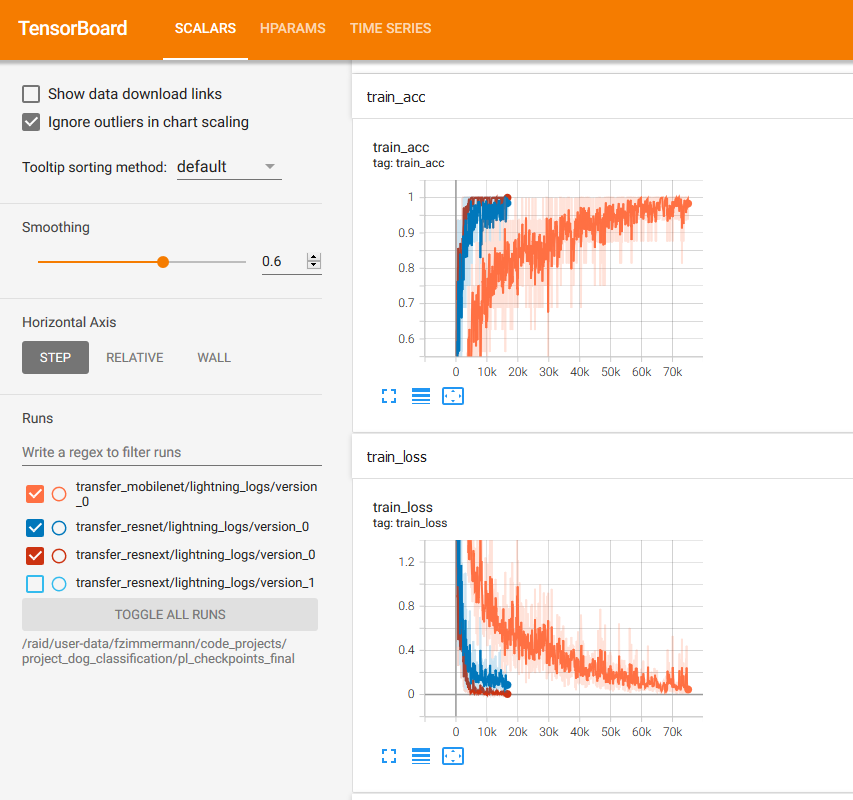

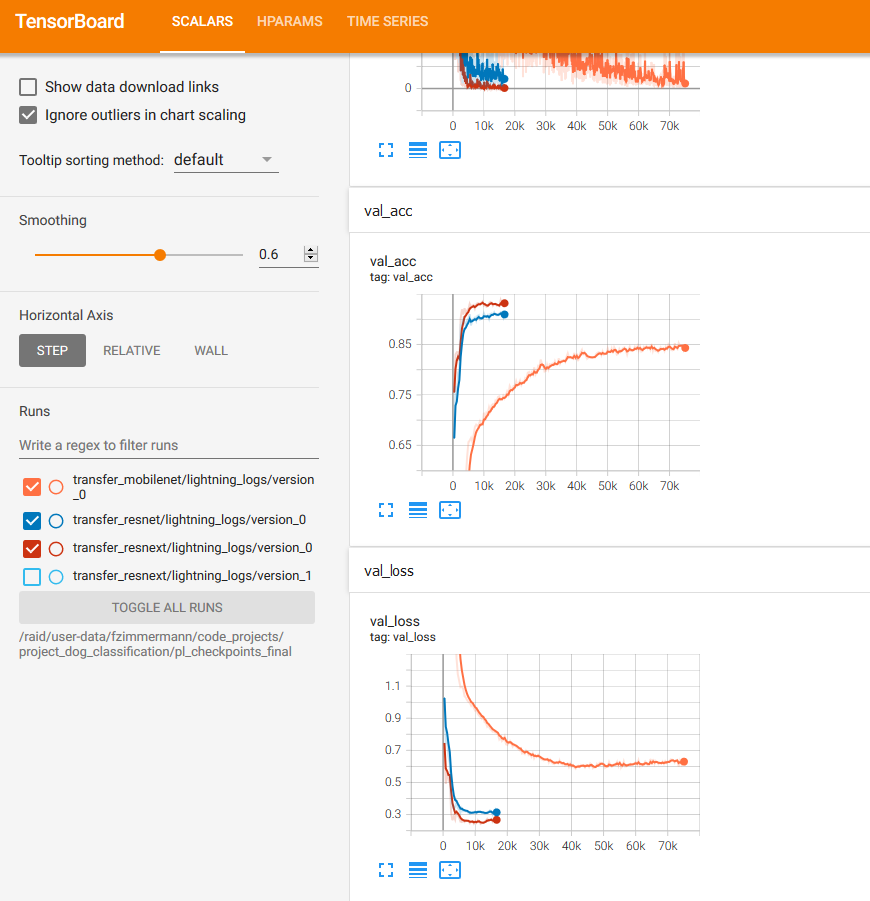

As you can see from the tensorboard screenshots above, the training loss decreases nicely over time and training and validation accuracies increase.

Test the trained ResNext model

In [14]:
!python ./src/lightning_cli_script.py --config ./pl_checkpoints_final/transfer_resnext/lightning_logs/version_0/config_test.yaml test --model.backbone resnext101_32x8d --model.fc_input_size 2048 


Global seed set to 42
Global seed set to 42
Global seed set to 1234
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/raid/user-data/fzimmermann/miniconda3/envs/dog_project/lib/python3.6/site-packages/pytorch_lightning/core/datamodule.py:122: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  "DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7."
/raid/user-data/fzimmermann/miniconda3/envs/dog_project/lib/python3.6/site-packages/pytorch_lightning/core/datamodule.py:115: LightningDeprecationWarning: DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7.
  "DataModule property `train_transforms` was deprecated in v1.5 and will be removed in v1.7."
Restoring states from the checkpoint path at /raid/user-data/fzimmermann/code_projects/project_dog_classification/pl_checkpoints_final/transf

In [10]:
from src.lightning_module_and_datasets import TransferLearningModel
PATH = ".\\pl_checkpoints_final\\transfer_resnext\\lightning_logs\\version_0\\checkpoints\\epoch=39-step=16679.ckpt"
model_transfer = TransferLearningModel.load_from_checkpoint(PATH, backbone="resnext101_32x8d", fc_input_size=2048)



Global seed set to 42
Downloading: "https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth" to C:\Users\zimme/.cache\torch\hub\checkpoints\resnext101_32x8d-8ba56ff5.pth


  0%|          | 0.00/340M [00:00<?, ?B/s]

### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [11]:
device = "cpu"
import numpy as np
### Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

# list of class names by index, i.e. a name can be accessed like class_names[0]
class_names = train_dataloader.dataset.classes
# in the code data_transfer['train'], data_transfer['valid'] and data_transfer['test'] all have an own classes attribute, however this should be the same due to the naming convention of the folders in the dataset
assert (train_dataloader.dataset.classes==train_dataloader.dataset.classes)
assert (train_dataloader.dataset.classes==test_dataloader.dataset.classes)

def predict_breed_transfer(img_path, model_transfer):
    # load the image and return the predicted breed
    model_transfer.eval()
    model_transfer = model_transfer.to(device)
    image = Image.open(img_path)
    # use image transformation from test dataset
    image = torch.unsqueeze(test_dataloader.dataset.transform(image), 0)
    image = image.to(device)
    output = model_transfer(image).data.cpu().numpy()  
    # convert output probabilities to predicted class
    pred_index=np.argmax(output, 1).item()
    return class_names[pred_index]
    


---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `human_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [12]:
import torch

def detect_dog_or_human(img_path):
    human_detected = face_detector(img_path)
    dog_detected = dog_detector(img_path)
    if dog_detected:
        return "dog"
    elif human_detected:
        return "human"
    else:
        return "neither"

def run_app(img_path):
    ## handle cases for a human face, dog, and neither
    detection_type = detect_dog_or_human(img_path)
    if detection_type=="dog":
        predicted_breed = predict_breed_transfer(img_path, model_transfer)
    elif detection_type=="human":
        predicted_breed = predict_breed_transfer(img_path, model_transfer)
    elif detection_type=="neither":
        print("Error: Neither a human nor a dog could be detected in the image.")
        return
    else:
        raise Exception("Unknown detection type returned by detect_dog_or_human")
    print(f"Hello {detection_type}!")
    img = cv2.imread(img_path)
    # convert BGR image to RGB for plotting
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(cv_rgb)
    plt.show()
    print(f"You look like a {predicted_breed}")

---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ The output is better than I expected. 
As a first step, I tried the algorithm on 3 dog and 3 human images. The algorithm was able to classify all human images as humans (although I chose on purpose one image of a lady that looks a bit "dog like") and all dog images as dogs. Moreover all dog breeds of real dog images were classified correctly. For the human images the humans really resemble the predicted dog breeds.
As a second step, I tried the algorithm on 8 images of dogs that look really similar to a different breed than they actually belong to. Even in those very difficult cases (where a human would likely fail) the algorithm finds the correct breed in 50% of all cases which shows that it has better performance than an experienced human classifier.
As a third step, I tested the robustness of the model showing it a poodle shown in side view and a poodle with clothes. The poodle from the side and the poodle with clothes are both classified as dogs with breed Bichon Frise which is not too bad since Bichon Frises look really similar to poodles.
An accuracy of over 90% on the test set shows that my trained classifier for predicting dog breeds is quite good already. However, from the tensorboard logs we can see that we're facing some overfittinghere during training. As a remedy you could increase the amount of training data (or do even more augmentation) and add more regularization during training (like more dropout or weight_decay for example). By that, we could maybe even increase the performance on the test set. 
I also tried what happens when we feed the algorithm images with humans and dogs or images with multiple different dog breeds. I tried 2 images with a human and a dog present and one image showing 4 different dogs belonging to 3 breeds. We can see that the algorithm classifies all images as “dog” which is understandable even in those cases where a human is visible as well because the check for “dog” is carried out first in the implementation and if a dog is found, the image is classified as “dog”.  The predicted breeds of the dogs present in the 2 images that also contain a human, however, are not understandable and far away from being correct. In the case of the image with 4 dogs present a breed that is not present at all was predicted which is also not correct. So we can conclude that our current model is not able to handle pictures with humans and dogs or multiple dog breeds reliably. If we'd like to have that we should convert the current image classification algorithm more to an object detection algorithm that is able to locate different object types in different parts of the image.

Hello human!


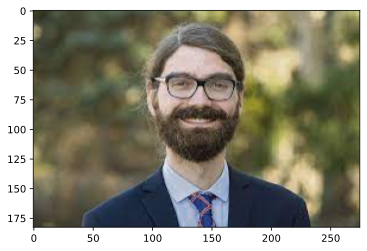

You look like a Miniature_schnauzer


Hello human!


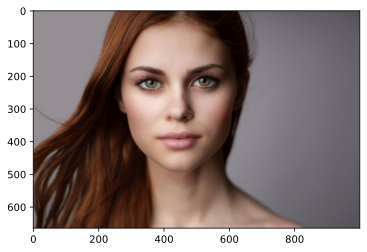

You look like a Cavalier_king_charles_spaniel


Hello human!


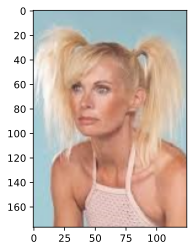

You look like a Maltese


Hello dog!


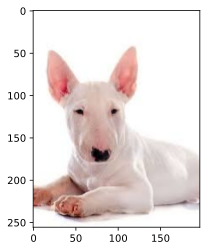

You look like a Bull_terrier


Hello dog!


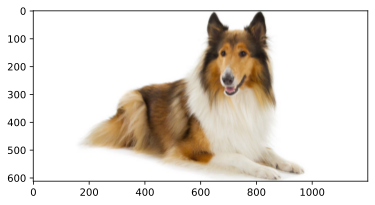

You look like a Collie


Hello dog!


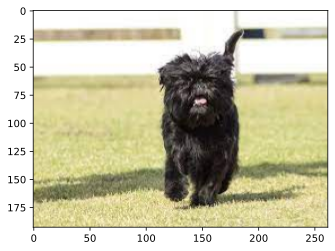

You look like a Affenpinscher




In [15]:
## Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.
dog_files = [".\\data\\own_images/bull_terrier.jfif",
            ".\\data\\own_images/collie.jpg",
            ".\\data\\own_images/affenpinscher.jfif"]
human_files = [".\\data\\own_images/man.jfif",
              ".\\data\\own_images/woman.jpg",
              ".\\data\\own_images/lady_like_dog.jfif"]
## suggested code, below
for file in np.hstack((human_files[:3], dog_files[:3])):
    run_app(file)
    print("\n")

In [ ]:
# Test the dog breed classifier on difficult examples (some taken from https://www.countryliving.com/uk/wildlife/dog-breeds/a34506051/look-alike-dog-breeds/)

C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\1_english_springer_daniel.jpg
Hello dog!


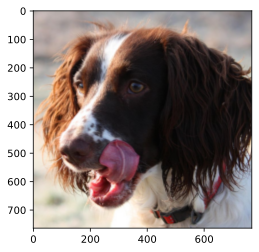

You look like a English_springer_spaniel


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\1_welsh_springer_daniel.jpg
Hello dog!


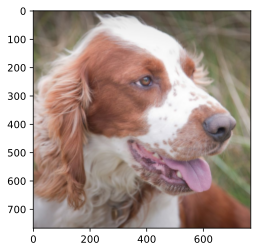

You look like a Ibizan_hound


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\2_italian_greyhound.jpg
Hello dog!


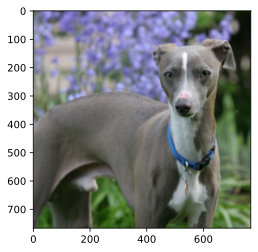

You look like a Italian_greyhound


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\2_whippet.jpg
Hello dog!


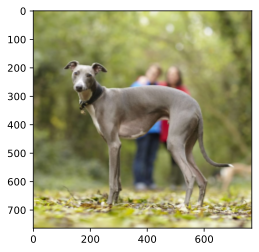

You look like a Italian_greyhound


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\3_boston_terrier.jpg
Hello dog!


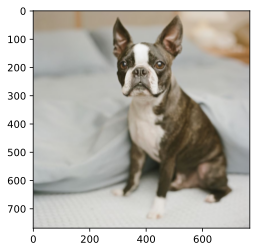

You look like a Boston_terrier


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\3_french_bulldog.jpg
Hello dog!


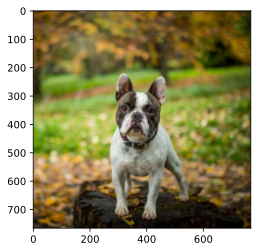

You look like a Boston_terrier


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\4_boxer.jpg
Hello dog!


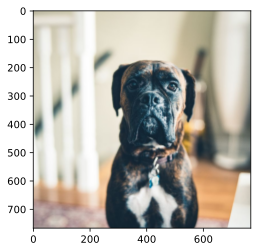

You look like a Cane_corso


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\4_cane_corso.jpg
Hello dog!


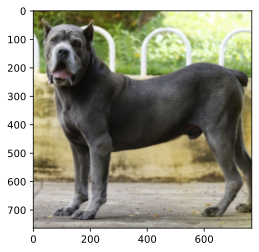

You look like a Cane_corso


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\poodle_from_side.jpg
Hello dog!


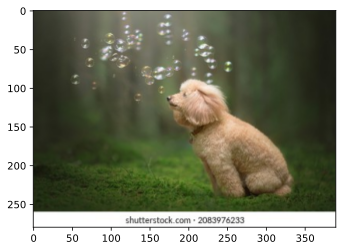

You look like a Bichon_frise


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Poodle_with_clothes.jpg
Hello dog!


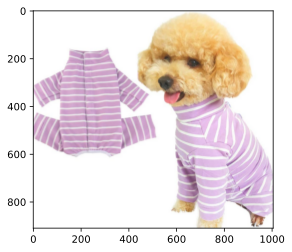

You look like a Bichon_frise


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Poodle_with_human_1.jfif
Hello dog!


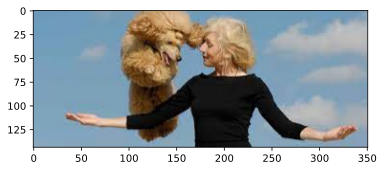

You look like a Bull_terrier


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Poodle_with_human_2.jfif
Hello dog!


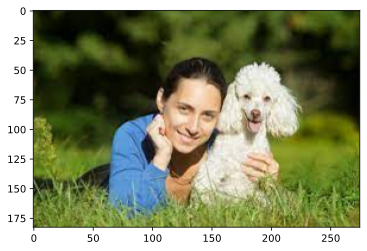

You look like a Welsh_springer_spaniel


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Rottweiler_chihuahua_poodel.jfif
Hello dog!


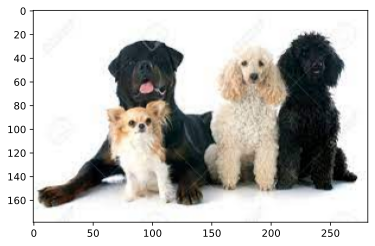

You look like a Chow_chow


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\1_english_springer_daniel.jpg
Hello dog!


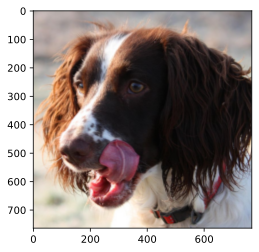

You look like a English_springer_spaniel


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\1_welsh_springer_daniel.jpg
Hello dog!


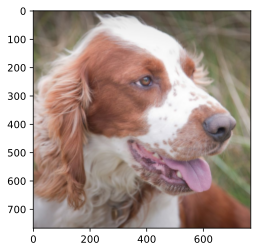

You look like a Ibizan_hound


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\2_italian_greyhound.jpg
Hello dog!


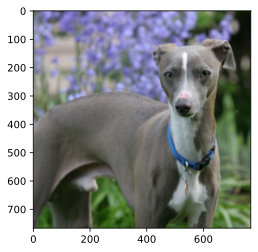

You look like a Italian_greyhound


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\2_whippet.jpg
Hello dog!


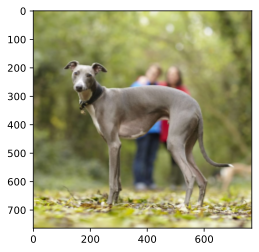

You look like a Italian_greyhound


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\3_boston_terrier.jpg
Hello dog!


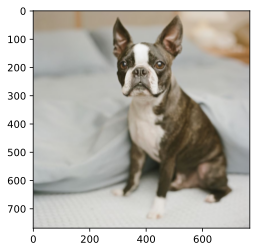

You look like a Boston_terrier


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\3_french_bulldog.jpg
Hello dog!


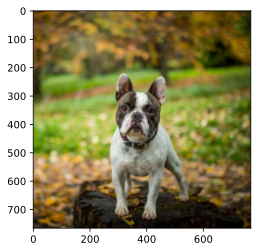

You look like a Boston_terrier


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\4_boxer.jpg
Hello dog!


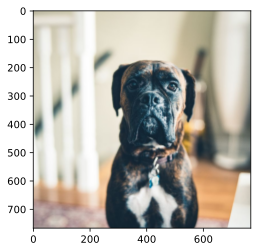

You look like a Cane_corso


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\4_cane_corso.jpg
Hello dog!


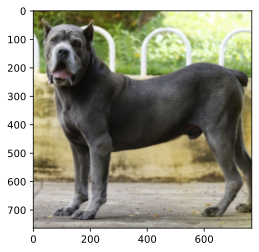

You look like a Cane_corso


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\poodle_from_side.jpg
Hello dog!


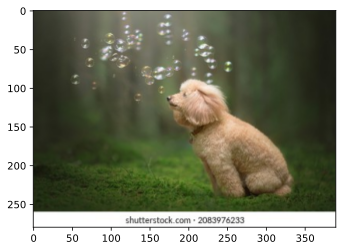

You look like a Bichon_frise


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\Poodle_with_clothes.jpg
Hello dog!


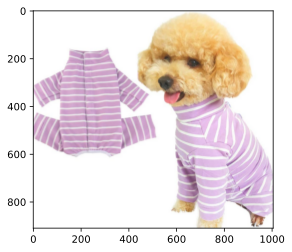

You look like a Bichon_frise


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\Poodle_with_human_1.jfif
Hello dog!


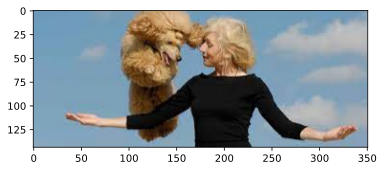

You look like a Bull_terrier


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\Poodle_with_human_2.jfif
Hello dog!


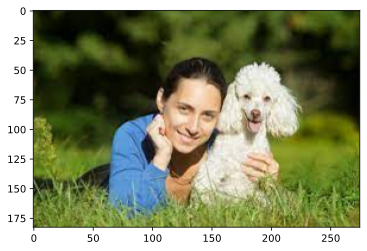

You look like a Welsh_springer_spaniel


C:\Users\zimme\Documents\Weiterbildung\Udacity\Final_project\data\own_images\Difficult_dog_images\Difficult_dog_images\Rottweiler_chihuahua_poodel.jfif
Hello dog!


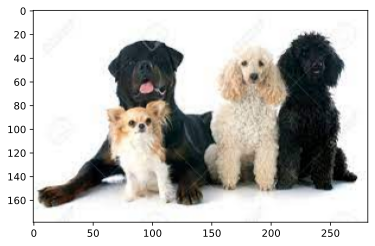

You look like a Chow_chow




In [16]:
from pathlib import Path

pathlist = Path(".\\data\\own_images\\Difficult_dog_images").rglob('*.*')
for path in pathlist:
  # because path is object not string
  path_in_str = str(path)
  print(path_in_str)
  run_app(path_in_str)
  print("\n")

    